# Evaluate ASR algorithm in motion artifacts removal

In [114]:
import glob
import numpy as np
import pandas as pd
import scipy.fftpack    
import seaborn as sns
import scipy.signal as signal
import matplotlib.pyplot as plt
from scipy.signal import correlate
from scipy.integrate import cumulative_trapezoid
from utils.signal_processing import filter_sos, filter_iir
from skimage.restoration import estimate_sigma
from utils.channel_selection import is_epoch_signal_bad
from meegkit.asr import ASR
import padasip as pa
from utils.utils import *

## Custom parameters

In [115]:
# Sampling rate and window length
fs = 250
eeg_chans = 7
demo_interval = 10*fs

## Load data from all required files

In [116]:
# Define the base directories and the associated labels
# Nhan
# dir_name = '1712094934_Nhan'

# directories = {
#     f'{dir_name}/1712094934_BASE_LINE': 'BASE_LINE',
#     f'{dir_name}/1712095682_VOR_1HZ': 'VOR_1HZ',
#     f'{dir_name}/1712095831_VOR_1HZ_REST': 'VOR_1HZ_REST',
#     f'{dir_name}/1712096475_VOR_2HZ': 'VOR_2HZ',
#     f'{dir_name}/1712096619_VOR_2HZ_REST': 'VOR_2HZ_REST',
#     f'{dir_name}/1712097275_VOR_3HZ': 'VOR_3HZ',
#     f'{dir_name}/1712097418_VOR_3HZ_REST': 'VOR_3HZ_REST',
#     f'{dir_name}/1712098656_VOR_4HZ': 'VOR_4HZ',
#     f'{dir_name}/1712098799_VOR_4HZ_REST': 'VOR_4HZ_REST'
# }

# directories = {
#     '1713458084_Andrei/1713458084_BASE_LINE': 'BASE_LINE'
# }

# Jacob
dir_name = '1713293584_Jacob'

directories = {
    f'{dir_name}/1713293584_BASE_LINE': 'BASE_LINE',
    f'{dir_name}/1713294328_VOR_1HZ': 'VOR_1HZ',
    f'{dir_name}/1713294472_VOR_1HZ_REST': 'VOR_1HZ_REST',
    f'{dir_name}/1713295133_VOR_2HZ': 'VOR_2HZ',
    f'{dir_name}/1713295276_VOR_2HZ_REST': 'VOR_2HZ_REST',
    f'{dir_name}/1713295919_VOR_3HZ': 'VOR_3HZ',
    f'{dir_name}/1713296059_VOR_3HZ_REST': 'VOR_3HZ_REST',
    f'{dir_name}/1713296831_VOR_4HZ': 'VOR_4HZ',
    f'{dir_name}/1713296971_VOR_4HZ_REST': 'VOR_4HZ_REST'
}

# # Saad
# dir_name = '1713994149_Saad'

# directories = {
#     f'{dir_name}/1713994149_BASE_LINE': 'BASE_LINE',
#     f'{dir_name}/1713994824_VOR_1HZ': 'VOR_1HZ',
#     f'{dir_name}/1713994964_VOR_1HZ_REST': 'VOR_1HZ_REST',
#     f'{dir_name}/1713995471_VOR_2HZ': 'VOR_2HZ',
#     f'{dir_name}/1713995610_VOR_2HZ_REST': 'VOR_2HZ_REST',
#     f'{dir_name}/1713996271_VOR_3HZ': 'VOR_3HZ',
#     f'{dir_name}/1713996412_VOR_3HZ_REST': 'VOR_3HZ_REST',
#     f'{dir_name}/1713996958_VOR_4HZ': 'VOR_4HZ',
#     f'{dir_name}/1713997104_VOR_4HZ_REST': 'VOR_4HZ_REST'
# }

# # Mallory
# dir_name = '1713901362_Mallory'

# directories = {
#     f'{dir_name}/1713901362_BASE_LINE': 'BASE_LINE',
#     f'{dir_name}/1713902187_VOR_1HZ': 'VOR_1HZ',
#     f'{dir_name}/1713902498_VOR_1HZ_REST': 'VOR_1HZ_REST',
#     f'{dir_name}/1713903156_VOR_2HZ': 'VOR_2HZ',
#     f'{dir_name}/1713903296_VOR_2HZ_REST': 'VOR_2HZ_REST',
#     f'{dir_name}/1713903987_VOR_3HZ': 'VOR_3HZ',
#     f'{dir_name}/1713904131_VOR_3HZ_REST': 'VOR_3HZ_REST',
# }


# # Alex
# dir_name = '1713550894_AlexKagoda'

# directories = {
#     f'{dir_name}/1713550894_BASE_LINE': 'BASE_LINE',
#     f'{dir_name}/1713551593_VOR_1HZ': 'VOR_1HZ',
#     f'{dir_name}/1713551737_VOR_1HZ_REST': 'VOR_1HZ_REST',
#     f'{dir_name}/1713552395_VOR_2HZ': 'VOR_2HZ',
#     f'{dir_name}/1713552534_VOR_2HZ_REST': 'VOR_2HZ_REST',
#     f'{dir_name}/1713553173_VOR_3HZ': 'VOR_3HZ',
#     f'{dir_name}/1713553317_VOR_3HZ_REST': 'VOR_3HZ_REST',
#     f'{dir_name}/1713554089_VOR_4HZ': 'VOR_4HZ',
#     f'{dir_name}/1713554229_VOR_4HZ_REST': 'VOR_4HZ_REST'
# }

# dir_name = '1713458084_Andrei'

# directories = {
#     f'{dir_name}/1713458084_BASE_LINE': 'BASE_LINE',
# }


# Initialize an empty dictionary to store the DataFrames
data_frames = {}
length = {}

# Loop through the directories and their labels
for dir_key, label in directories.items():
    file_pattern = f'./data/logging/{dir_key}/CONVERTED_*'
    file_names = sorted(glob.glob(file_pattern))
    
    data_frames[label] = pd.concat([pd.read_csv(file_name, sep='\t') for file_name in file_names])
    data_frames[label] = data_frames[label].drop(columns=['index', 'time stamp'])
    length[label] = len(data_frames[label])

# Concatenate all the data into a single DataFrame
data = pd.concat(data_frames.values())

## Channel name and channel labels

In [117]:
channel_names_or = ['O1', 'O2', 'C3', 'C4', 'H-EOG', 'V-EOG', 'ECG', 'EDA', 'Heart rate', 'accel']    
channel_labels = ['uV', 'uV', 'uV', 'uV', 'uV', 'uV', 'uV', 'V/1024', 'BPM', 'g (1g = 9.8m/s^2)']

## Filter the data

In [118]:
filtered_data = []
raw_data = []
for i in range(data.shape[1]-1):
    column_data = data.iloc[:, i].to_numpy().copy()
    raw_data.append(column_data)
    # 7 channels
    if i < 6:        
        column_data, _ = filter_sos(column_data, 'bandpass', [4, 50.0], fs, 4)
        column_data, _ = filter_sos(column_data, 'notch', 50.0, fs, 2, notchWidth=4)
        column_data, _ = filter_sos(column_data, 'notch', 60.0, fs, 2, notchWidth=4)
    if i == 6:
        column_data = filter_iir(column_data, 'bandpass', [5, 50.0], fs, 4)
        column_data = filter_iir(column_data, 'notch', 50.0, fs, 2, notch_width=4)
        column_data = filter_iir(column_data, 'notch', 60.0, fs, 2, notch_width=4)
        
        b, a = signal.butter(4, 50/(fs/2), 'low')
        tempf = signal.filtfilt(b,a, column_data)
        tempf = signal.filtfilt(b,a, column_data)
        yff = scipy.fftpack.fft(tempf)

        nyq_rate = fs/ 2.0
        width = 5.0/nyq_rate
        ripple_db = 60.0
        O, beta = signal.kaiserord(ripple_db, width)
        cutoff_hz = 4.0
        taps = signal.firwin(O, cutoff_hz/nyq_rate, window=('kaiser', beta), pass_zero=False)
        # Use lfilter to filter x with the FIR filter.
        column_data = signal.lfilter(taps, 1.0, tempf)

    filtered_data.append(column_data)
    
vector_sum = compute_vector_sum(filtered_data[8], filtered_data[9], filtered_data[10])
filtered_data.append(vector_sum)
filtered_data = np.array(filtered_data)
raw_data = np.array(raw_data)

## Extract the IMU features

In [119]:
motion_artifacts = []

for i in range(8, 11):
    filtered = filter_iir(filtered_data[i], 'bandpass', [1, 50], fs, 4)
    # filtered,_ = filter_sos(filtered_data[i], 'bandpass', [1, 50], fs, 4)
    motion_artifacts.append(filtered)

    
sum_square_ma = compute_vector_sum(motion_artifacts[0], motion_artifacts[1], motion_artifacts[2])

dt = 1/fs
velocity = [cumulative_trapezoid(y=a, dx=dt, initial=0) for a in motion_artifacts]
velocity = np.array(velocity)
sum_square_velocity = compute_vector_sum(velocity[0], velocity[1], velocity[2])

imu_features = np.array([velocity[0], 
                            velocity[1], 
                            velocity[2], 
                            motion_artifacts[0], 
                            motion_artifacts[1], 
                            motion_artifacts[2], 
                            sum_square_velocity,
                            sum_square_ma])

imu_labels = ['Vel-X', 'Vel-Y', 'Vel-Z', 'Accel-X', 'Accel-Y', 'Accel-Z', 'Vel-Square', 'Accel-Square']

## Stimulation index

In [120]:
# Andrei
# stim1_idx = 670*fs
# post_stim1_idx = 950*fs

# stim2_idx = 1680*fs
# post_stim2_idx = 1840*fs

# stim3_idx = 2510*fs
# post_stim3_idx = 2642*fs

# stim4_idx = 3394*fs
# post_stim4_idx = 3520*fs

stim_mark_start = [67, 168, 251, 339]
stim_mark_end = [95, 184, 264, 352]

# Saad
stim1_idx = 610*fs
post_stim1_idx = 740*fs

stim2_idx = 1216*fs
post_stim2_idx = 1346*fs

stim3_idx = 1956*fs
post_stim3_idx = 2086*fs

stim4_idx = 2608*fs
post_stim4_idx = 2738*fs

# stim_mark_start = [61, 135, 209, 296]
# stim_mark_end = [74, 148, 222, 310]

# Andrei
# stim1_idx = 670*fs
# post_stim1_idx = 950*fs

# stim2_idx = 1680*fs
# post_stim2_idx = 1840*fs

# stim3_idx = 2510*fs
# post_stim3_idx = 2642*fs

# stim4_idx = 3394*fs
# post_stim4_idx = 3520*fs

# stim_mark_start = [67, 168, 251, 339]
# stim_mark_end = [95, 184, 264, 352]

n_samples = len(data)

## EDA

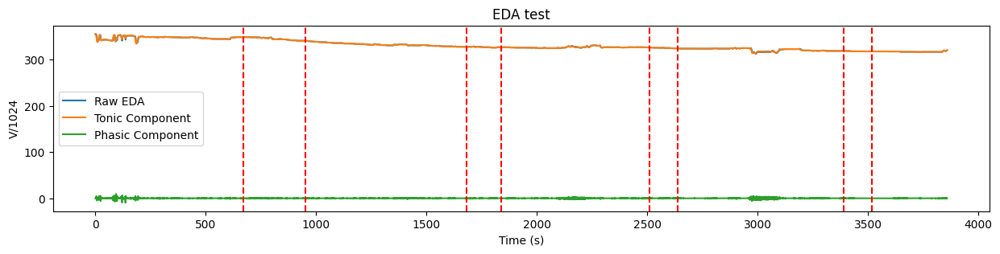

In [121]:
eda = filtered_data[7][::50]

def decompose_eda_signal(eda, fs=1.0, lowpass_cutoff=0.1):
    # Apply a low-pass filter to extract the tonic component
    b, a = signal.butter(2, lowpass_cutoff / (0.5 * fs), btype='low')
    tonic = signal.filtfilt(b, a, eda)
    # The phasic component is the original signal minus the tonic component
    phasic = eda - tonic
    
    return tonic, phasic

tonic, phasic = decompose_eda_signal(eda, 1, 0.02)

eda_series = pd.Series(eda)

smoothed_eda = eda_series.ewm(span=20).mean()
smoothed_eda = smoothed_eda.values

plt.figure(figsize=(15, 3))    
plt.plot(np.arange(len(eda))/5, smoothed_eda, label='Raw EDA')
plt.plot(np.arange(len(eda))/5, tonic, label='Tonic Component')
plt.plot(np.arange(len(eda))/5, phasic, label='Phasic Component')

for j in range(len(stim_mark_start)):
    plt.axvline(x=stim_mark_start[j]*10, color='red', linestyle='--')
    plt.axvline(x=stim_mark_end[j]*10, color='red', linestyle='--')
    
plt.xlabel('Time (s)')
plt.ylabel('V/1024')
plt.title('EDA test')
plt.legend()
plt.show()


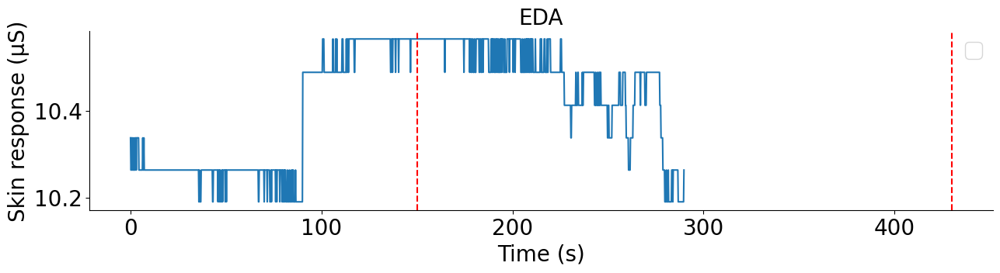

In [122]:
# Visualize for the paper
plt.figure(figsize=(15, 3))    
# plt.plot(np.arange(len(eda[520*5:810*5]))/5, eda[520*5:810*5], label='Raw EDA')

ohm = ((1024+2*eda[520*5:810*5])*1000000)/(512-eda[520*5:810*5])/1000000
plt.plot(np.arange(len(eda[520*5:810*5]))/5, ohm)

for j in range(1):
    plt.axvline(x=(stim_mark_start[j]-52)*10, color='red', linestyle='--')
    plt.axvline(x=(stim_mark_end[j]-52)*10, color='red', linestyle='--')
    
# Hide the right and top spines
ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

plt.xlabel('Time (s)', fontsize=20)
plt.ylabel('Skin response (μS)', fontsize=20)
plt.title('EDA', fontsize=20)
plt.legend(fontsize=20)
ax.tick_params(axis='both', labelsize=20)  # Adjust the size as needed

# plt.savefig('figures/eda.svg', format='svg', bbox_inches='tight')


plt.show()

## Detect motion artifacts

### Ground truth for motion detection

In [123]:
motion_ground_truth = [1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 
                      0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 
                      0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]


### Auto detection demo

In [124]:
demo_indices = detect_motion(sum_square_ma[:length['BASE_LINE']], fs)

In [125]:
# from sklearn.metrics import f1_score, accuracy_score
# unconfirm = []
# for i in demo_indices:
#     unconfirm.append(i[0] if i[0] != 2 else 0)

# f1 = f1_score(motion_ground_truth, unconfirm)
# accuracy = accuracy_score(motion_ground_truth, unconfirm)

# f1, accuracy

In [126]:
for i in range(len(motion_ground_truth)):
    if motion_ground_truth[i] != unconfirm[i]:
        print(i, motion_ground_truth[i])

0 1
7 1
8 0
9 0
11 1
12 1
13 0
14 0
15 0
16 0
21 0
29 0
34 1
38 0
39 1
40 1
42 0
46 1
48 1
49 1
52 1
59 1
60 1


In [127]:
window_size_sec = 10
signal_bad_indices = []
for window_start in range(0, length['BASE_LINE'], window_size_sec * fs):
    window_end = window_start + window_size_sec * fs    
    if window_end >  length['BASE_LINE']:
        break
    
    segment = raw_data[:4, window_start:window_end]
    status_o1 = is_epoch_signal_bad(segment[0], fs)
    status_o2 = is_epoch_signal_bad(segment[1], fs)
    status_c3 = is_epoch_signal_bad(segment[2], fs)
    status_c4 = is_epoch_signal_bad(segment[3], fs)
    status = status_o1 and status_o2 and status_c3 and status_c4
    signal_bad_indices.append(status)
    
signal_bad_indices = [int(value) for value in signal_bad_indices]

In [128]:
# true_motion_detected = []
# for i in range(len(demo_indices)):
#     true_label = 0
#     if (demo_indices[i][0]==1) or (demo_indices[i][0]==2 and signal_bad_indices[i]==1):
#         true_label = 1
#     true_motion_detected.append(true_label)
    
# f1 = f1_score(motion_ground_truth, true_motion_detected)
# accuracy = accuracy_score(motion_ground_truth, true_motion_detected)

# f1, accuracy

### Apply the motion detection pipeline on the whole data

In [129]:
motion_indices = detect_motion(sum_square_ma, fs)

In [130]:
window_size_sec = 10
signal_bad_indices = []
for window_start in range(0, n_samples, window_size_sec * fs):
    window_end = window_start + window_size_sec * fs    
    if window_end > n_samples:
        break
    
    segment = raw_data[:6, window_start:window_end]
    status_o1 = is_epoch_signal_bad(segment[0], fs)
    status_o2 = is_epoch_signal_bad(segment[1], fs)
    status_c3 = is_epoch_signal_bad(segment[2], fs)
    status_c4 = is_epoch_signal_bad(segment[3], fs)
    status_eogh = is_epoch_signal_bad(segment[4], fs)
    status_eogv = is_epoch_signal_bad(segment[5], fs)
    
    status = status_o1 and status_o2 and status_c3 and status_c3
    signal_bad_indices.append([status, status_o1, status_o2, status_c3, status_c4, status_eogh, status_eogv])


In [131]:
true_motion_detected = []

for i in range(len(motion_indices)):
    true_label = 0
    if (motion_indices[i][0]==1) or (motion_indices[i][0]==2 and signal_bad_indices[i][0]==1):
        true_label = 1
    true_motion_detected.append([true_label, motion_indices[i][1]])

## Apply SWT+ASR based on IMU features, local perfection first

In [132]:
from scipy.stats import pearsonr
import pywt

window_size_sec = 10
decomposition_level = 5
expo = 2**decomposition_level
wavelet = 'db4'
# The expected value is 2496
swt_len = int(window_size_sec * fs / expo)*expo
asr_num_chans = 4

local_motion_idx = 3160*fs
local_post_motion_idx = local_motion_idx + swt_len

In [133]:
local_motion_indices = true_motion_detected[316]

print(local_motion_indices)

[1, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]


In [134]:
eeg_stim = filtered_data[:asr_num_chans, local_motion_idx:local_post_motion_idx]
imu_stim = imu_features[:, local_motion_idx:local_post_motion_idx]
imu_lags = imu_features.copy()

# First, correct the phase shift for all IMU features for each EEG channel
# adjusted_imu_features = np.zeros_like(imu_stim)
adjusted_imu_features = np.zeros((eeg_stim.shape[0], imu_stim.shape[0], imu_stim.shape[1]))

for eeg_index in range(eeg_stim.shape[0]):
    for imu_index in range(imu_stim.shape[0]):
        correlation = correlate(eeg_stim[eeg_index], imu_stim[imu_index], mode='full')
        lags = np.arange(-len(correlation) // 2, len(correlation) // 2 + 1)
        max_corr_index = np.argmax(np.abs(correlation))
        lag = lags[max_corr_index]
        # Limit the lag to only 1 s
        if abs(lag) > 0.5*fs:
            lag=0
            
        adjusted_imu_features[eeg_index, imu_index] = adjust_imu_feature(imu_stim[imu_index], lag)

[0.1894458436521942, 0.14696393717762696, 0.06101288161386534, 0.46944481380703584]
[4, 4, 7, 3]


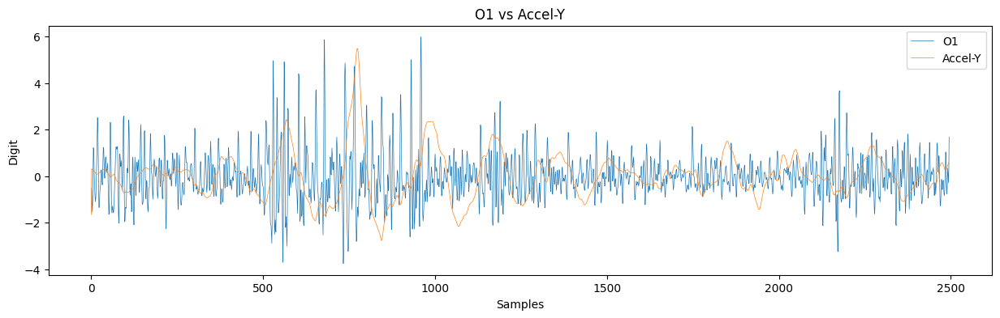

In [135]:
# After adjusting for lags, calculate Pearson correlation between all adjusted IMU features and all EEG channels
best_imu_for_eeg = []  # To store the index of the best-correlated IMU feature for each EEG channel
corr_list = []
for eeg_index in range(eeg_stim.shape[0]):
    max_correlation = -np.inf
    best_imu_index = None
    for imu_index in range(adjusted_imu_features.shape[1]):
        corr, _ = pearsonr(eeg_stim[eeg_index], adjusted_imu_features[eeg_index, imu_index])
        if corr > max_correlation:
            max_correlation = corr
            best_imu_index = imu_index
    best_imu_for_eeg.append(best_imu_index)
    corr_list.append(max_correlation)
print(corr_list)
print(best_imu_for_eeg)

plot_normalized([eeg_stim[0], adjusted_imu_features[0, 1]], ['O1', imu_labels[4]], ['Samples', 'Digit'], f'O1 vs {imu_labels[4]}')


0 0.1894458436521942
3 0.46944481380703584


e:\gitwork\Bio_Signal_Processing\utils\utils.py:118: RuntimeWarning: invalid value encountered in true_divide
  normalized_signal = (signal - mean) / std


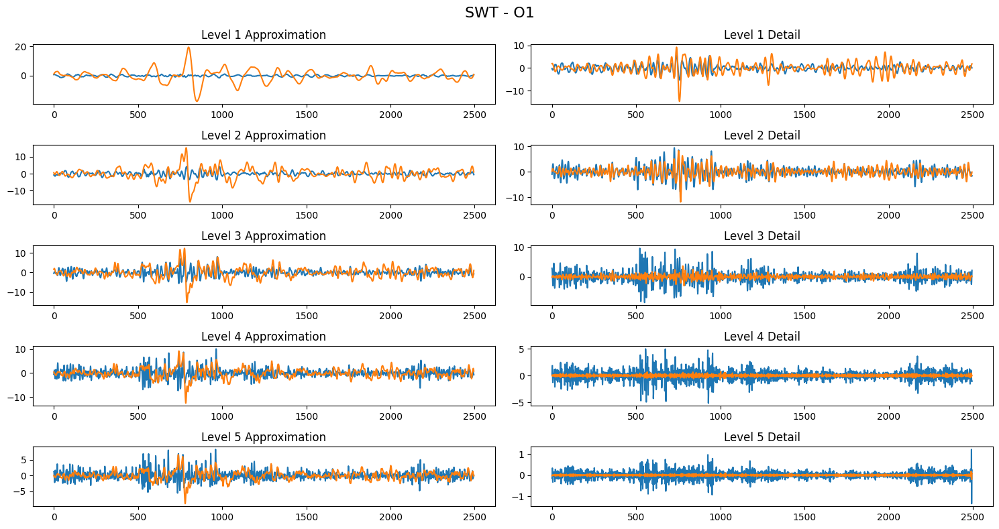

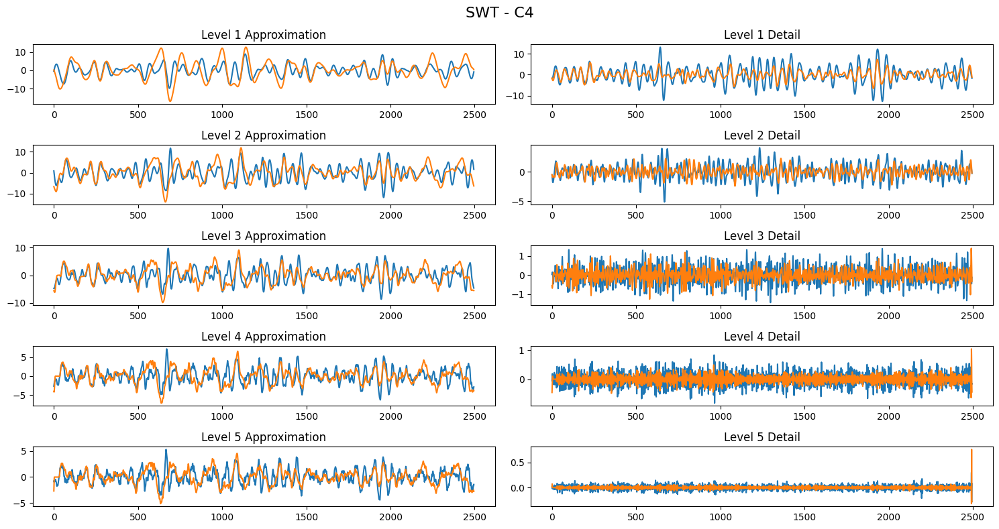

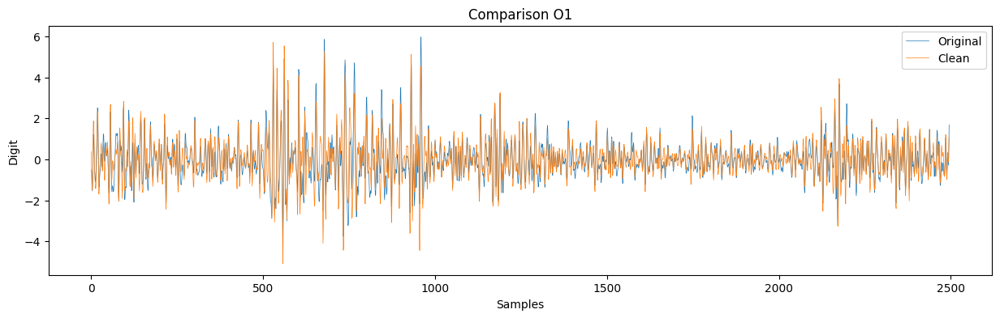

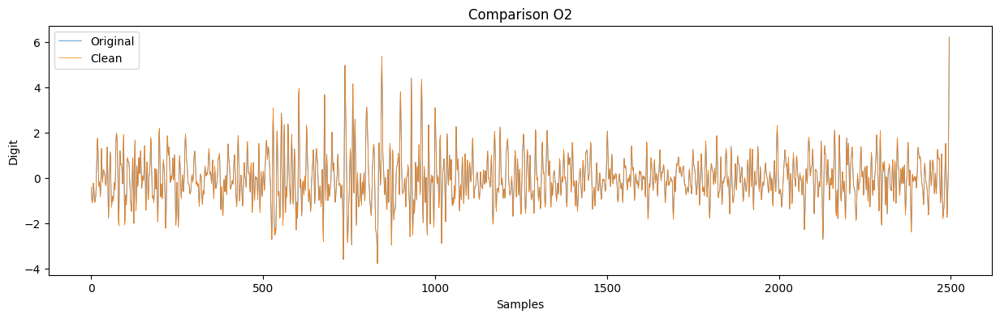

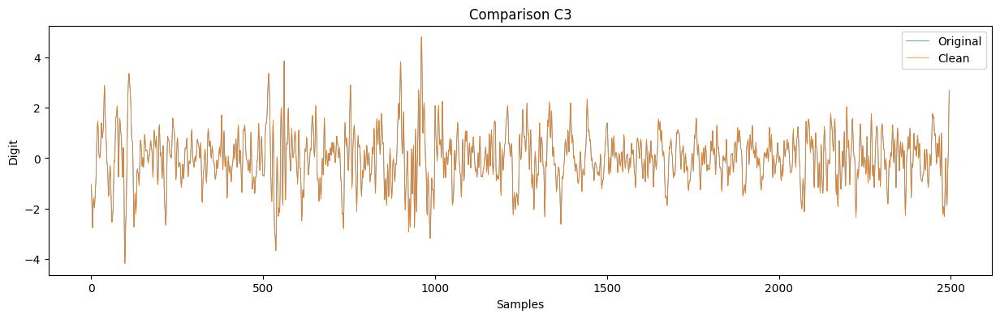

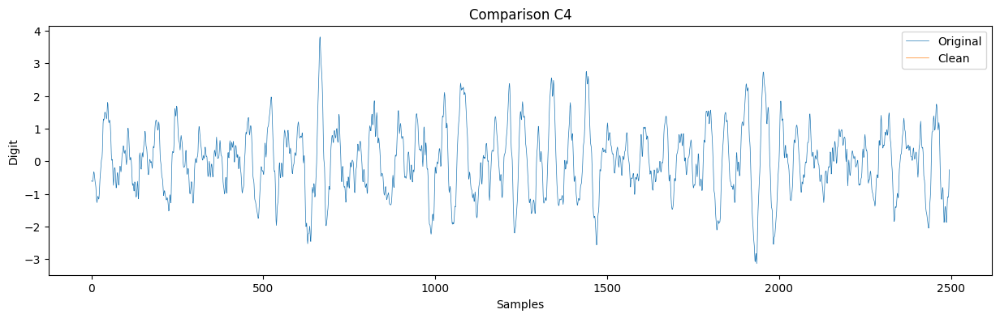

In [136]:
clean_eeg_single_asr = []
strides = swt_len

for eeg_index in range(eeg_stim.shape[0]):
    if not signal_bad_indices[316][eeg_index+1]:
        clean_eeg_single_asr.append(eeg_stim[eeg_index])
    else:
        max_correlation = -np.inf
        best_imu_index = None
        for imu_index in range(adjusted_imu_features.shape[1]):
            corr, _ = pearsonr(eeg_stim[eeg_index], adjusted_imu_features[eeg_index, imu_index])
            if corr > max_correlation:
                max_correlation = corr
                best_imu_index = imu_index
        print(eeg_index, max_correlation)

        ##############################################################################################################
        # Apply Adaptive filtering to generate noise for the signal 
        ##############################################################################################################
        # Perform Wavelet Transform on both reference and EEG data to decompose them
        eeg_swt = eeg_stim[eeg_index:eeg_index+1].copy()
        ref_swt = adjusted_imu_features[eeg_index, best_imu_index:best_imu_index+1]
        # ref_swt = filtered_data[eeg_index:eeg_index+1, 3140*fs:3140*fs+4992]
        
        ref_dat_z, swt_ref_zparams = z_score_normalize(ref_swt)
        eeg_dat_z, eeg_data_zparams = z_score_normalize(eeg_swt)
        
        # lms_filter = pa.filters.FilterNLMS(n=1, mu=0.1, w="random")
        # ma_reference, e, w = lms_filter.run(ref_dat_z.reshape(-1), eeg_dat_z.reshape(eeg_dat_z.shape[1], 1))
        # ref_dat_z = ma_reference.reshape(1,-1)

        ##############################################################################################################
        # Start the SWT here 
        ##############################################################################################################
        coeffs_ref_swt = pywt.swt(ref_dat_z[0], wavelet, level=decomposition_level)
        coeffs_eeg_swt = pywt.swt(eeg_dat_z[0], wavelet, level=decomposition_level)
        
        ##############################################################################################################
        # Run the ASR clean on the SWT decompositions
        ##############################################################################################################
        coeffs_ref = np.array(coeffs_ref_swt)
        coeffs_eeg = np.array(coeffs_eeg_swt)
        
        # Extract approximation coefficients and detail coefficients of the ref signal
        ref_approx_coeffs = coeffs_ref[:, 0, :]
        ref_detail_coeffs = coeffs_ref[:, 1, :]

        # Extract approximation coefficients and detail coefficients of the eeg signal
        eeg_approx_coeffs = coeffs_eeg[:, 0, :]
        eeg_detail_coeffs = coeffs_eeg[:, 1, :]

        eeg_detail_asr = eeg_detail_coeffs.copy()
        ref_detail_asr = ref_detail_coeffs.copy()

        eeg_approx_asr = eeg_approx_coeffs.copy()
        ref_approx_asr = ref_approx_coeffs.copy()
        
        #####################################################################################
        eeg_start_components = 0
        eeg_end_components = 5
        
        #####################################################################################
        #####################################################################################

            
        #####################################################################################
        #####################################################################################
        asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.66, cutoff=15)   
        _, sample_mask = asr.fit(ref_detail_coeffs[eeg_start_components:eeg_end_components])        
        
        for idx in range(0, eeg_detail_coeffs.shape[1], strides):  
            if idx+strides > eeg_detail_coeffs.shape[1]:
                break  
            bad_data = eeg_detail_asr[eeg_start_components:eeg_end_components, idx:idx+strides]    
            clean_data, ma = asr.transform(bad_data)
            eeg_detail_asr[eeg_start_components:eeg_end_components, idx:idx+strides] = ma
        eeg_detail_asrs = eeg_detail_asr[eeg_start_components:eeg_end_components]

        #####################################################################################
        #####################################################################################
        asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.66, cutoff=15)   
        _, sample_mask = asr.fit(ref_approx_coeffs[eeg_start_components:eeg_end_components])        
        
        for idx in range(0, eeg_approx_coeffs.shape[1], strides):  
            if idx+strides > eeg_approx_coeffs.shape[1]:
                break        
            bad_data = eeg_approx_asr[eeg_start_components:eeg_end_components, idx:idx+strides]       
            clean_data, ma = asr.transform(bad_data)
            eeg_approx_asr[eeg_start_components:eeg_end_components, idx:idx+strides] = ma
        eeg_approx_asrs = eeg_approx_asr[eeg_start_components:eeg_end_components]
        
        #####################################################################################
        fig, axs = plt.subplots(decomposition_level, 2, figsize=(15, 8))
        fig.suptitle(f'SWT - {channel_names_or[eeg_index]}', fontsize=16)

        for level in range(decomposition_level):
            axs[level, 0].plot(coeffs_eeg_swt[level][0][:])
            axs[level, 0].plot(coeffs_ref_swt[level][0][:])
            axs[level, 0].set_title(f'Level {level + 1} Approximation')

            # Detail coefficients
            axs[level, 1].plot(coeffs_eeg_swt[level][1][:])
            axs[level, 1].plot(coeffs_ref_swt[level][1][:])
            axs[level, 1].set_title(f'Level {level + 1} Detail')

        plt.tight_layout()
            
        coeffs_for_reconstruction = [(eeg_approx_asrs[i], eeg_detail_asrs[i]) for i in range(eeg_approx_asrs.shape[0])]    
        # coeffs_for_reconstruction = [(eeg_detail_asrs[i]) for i in range(eeg_approx_asrs.shape[0])]    

        clean_eeg_single_asr.append(pywt.iswt(coeffs_for_reconstruction, wavelet))
        
# Plot the clean data
for i in range(asr_num_chans):
    plot_normalized([eeg_stim[i], clean_eeg_single_asr[i]], ['Original', 'Clean'], ['Samples', 'Digit'], f'Comparison {channel_names_or[i]}')

### Apply it on the rotation data - VOR 1Hz

In [137]:
from scipy.stats import pearsonr
import pywt

window_size_sec = 10
decomposition_level = 5
expo = 2**decomposition_level
wavelet = 'db4'
swt_len = int(window_size_sec * fs / expo)*expo
asr_num_chans = 6

local_window = 62
local_motion_idx = local_window*10*fs
local_post_motion_idx = local_motion_idx + swt_len

local_motion_indices = true_motion_detected[62]

eeg_stim = filtered_data[:asr_num_chans, local_motion_idx:local_post_motion_idx]
imu_stim = imu_features[:, local_motion_idx:local_post_motion_idx]
imu_lags = imu_features.copy()

adjusted_imu_features = np.zeros((eeg_stim.shape[0], imu_stim.shape[0], imu_stim.shape[1]))

for eeg_index in range(eeg_stim.shape[0]):
    for imu_index in range(imu_stim.shape[0]):
        correlation = correlate(eeg_stim[eeg_index], imu_stim[imu_index], mode='full')
        lags = np.arange(-len(correlation) // 2, len(correlation) // 2 + 1)
        max_corr_index = np.argmax(np.abs(correlation))
        lag = lags[max_corr_index]
        # Limit the lag to only 1 s
        if abs(lag) > 1*fs:
            lag=0
            
        adjusted_imu_features[eeg_index, imu_index] = adjust_imu_feature(imu_stim[imu_index], lag)

0 0.06419089508271714
1 0.06304320633860623
2 0.039238756889523115
3 0.045419287023292565
4 0.07467394282887324
5 0.06924740125730397


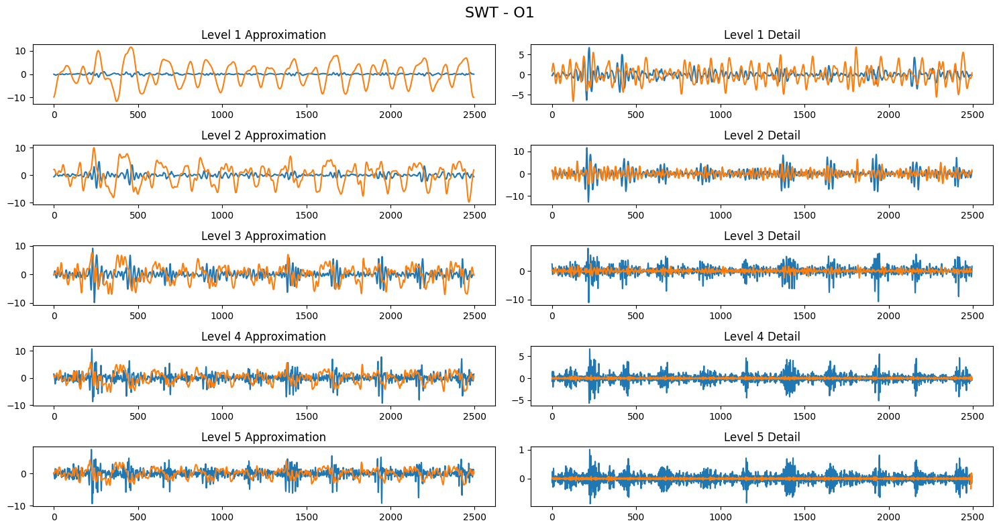

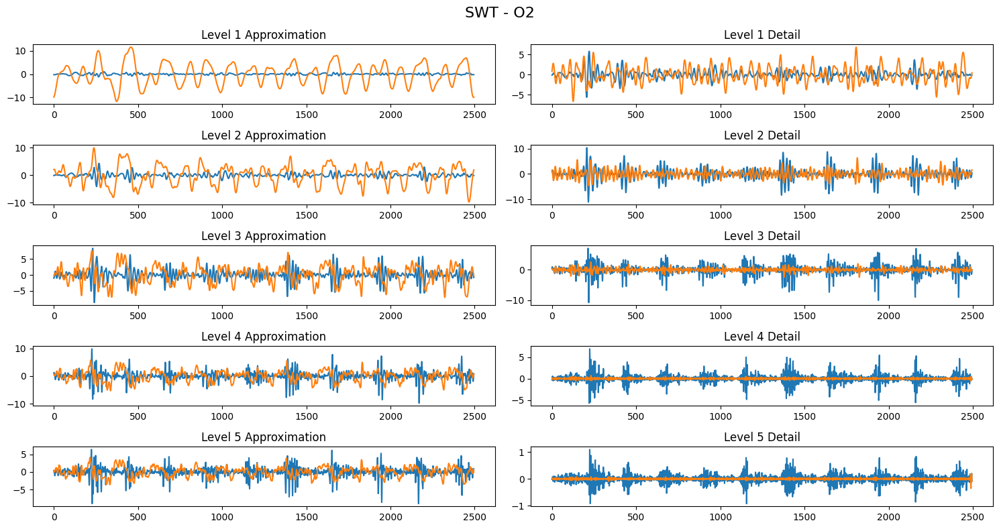

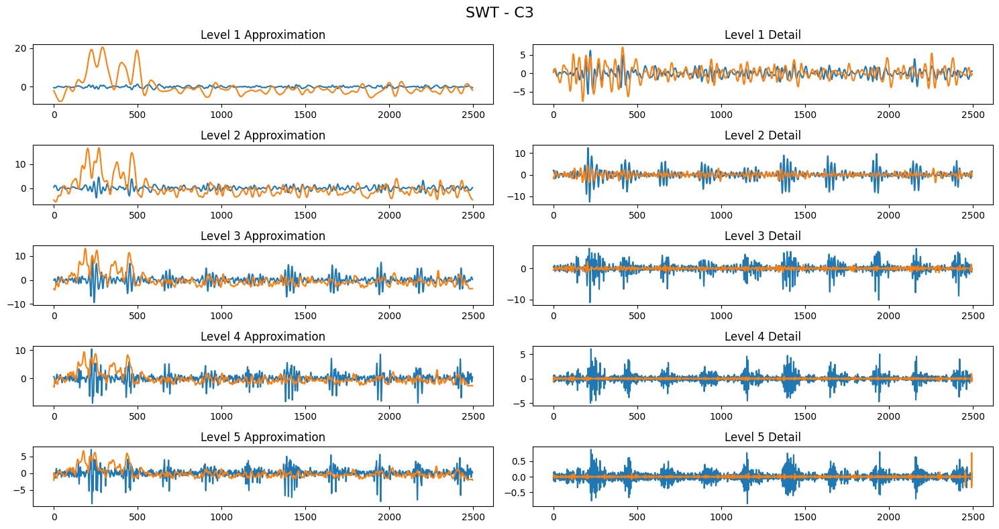

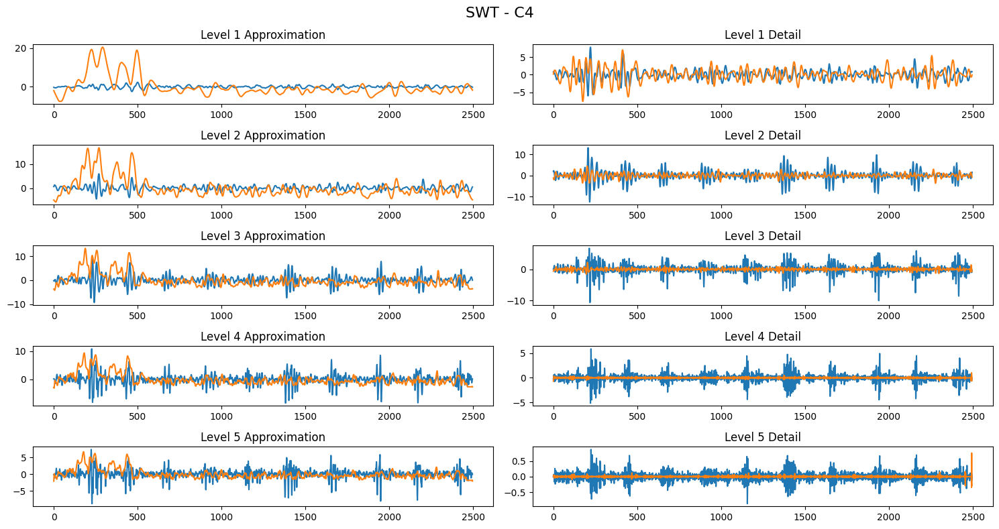

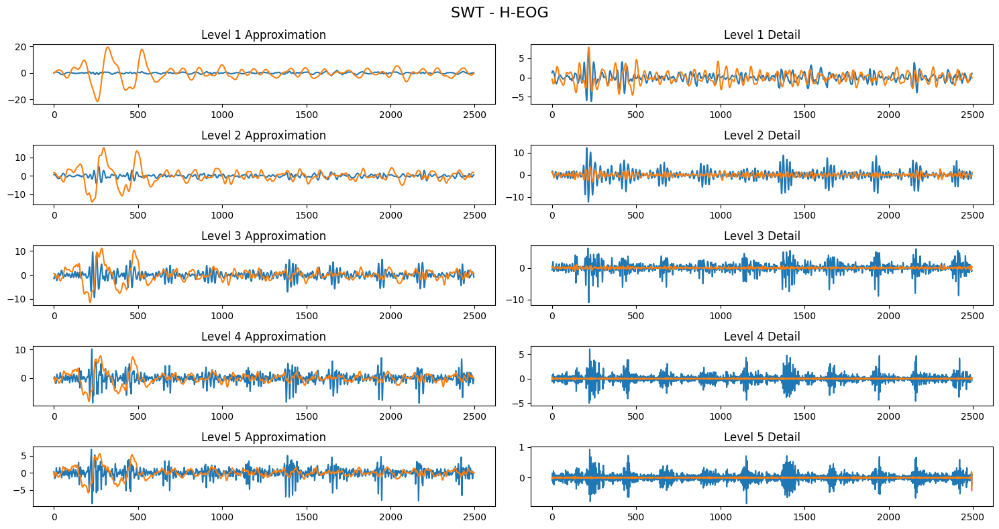

...

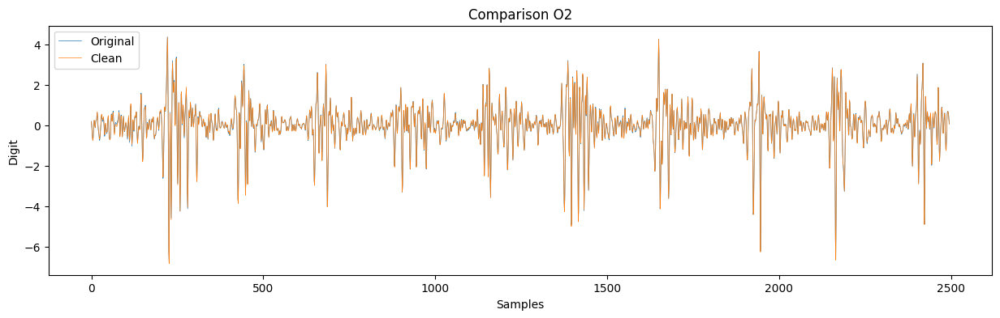

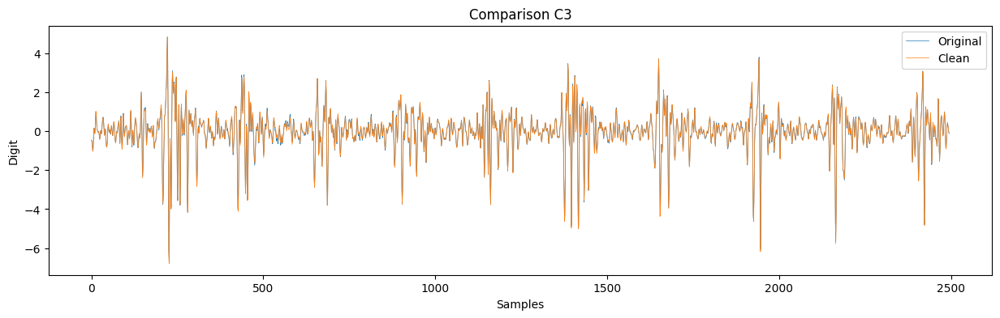

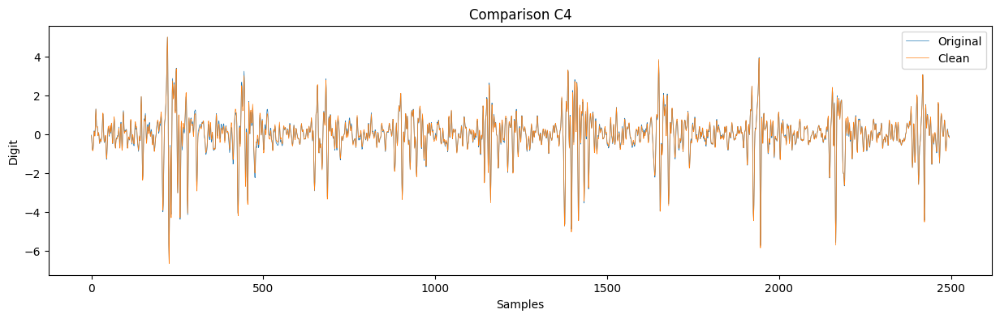

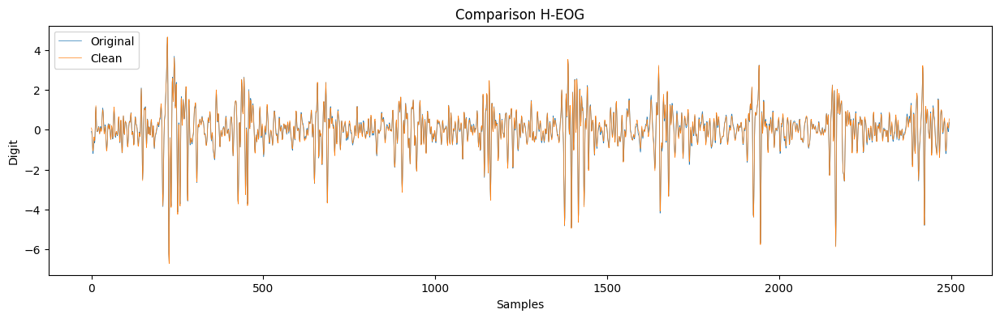

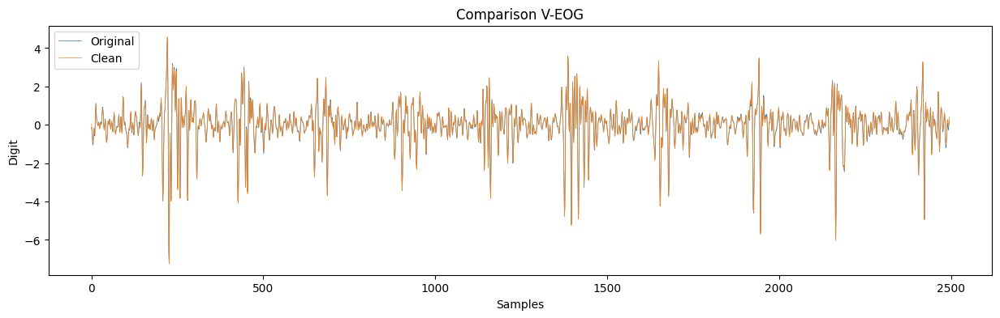

In [138]:
clean_eeg_single_asr = []
strides = swt_len

asr_data = filtered_data.copy()

for eeg_index in range(eeg_stim.shape[0]):
    if not signal_bad_indices[local_window][eeg_index+1]:
        clean_eeg_single_asr.append(eeg_stim[eeg_index])
    else:
        max_correlation = -np.inf
        best_imu_index = None
        for imu_index in range(adjusted_imu_features.shape[1]):
            corr, _ = pearsonr(eeg_stim[eeg_index], adjusted_imu_features[eeg_index, imu_index])
            if corr > max_correlation:
                max_correlation = corr
                best_imu_index = imu_index
        print(eeg_index, max_correlation)

        ##############################################################################################################
        # Apply Adaptive filtering to generate noise for the signal 
        ##############################################################################################################
        # asr_data[eeg_index], _ = filter_sos(asr_data[eeg_index], 'bandpass', [4, 50.0], fs, 4)

        # Perform Wavelet Transform on both reference and EEG data to decompose them
        eeg_swt = asr_data[eeg_index:eeg_index+1, local_motion_idx:local_post_motion_idx].copy()
        ref_swt = adjusted_imu_features[eeg_index, best_imu_index:best_imu_index+1]
        # ref_swt = filtered_data[eeg_index:eeg_index+1, 3140*fs:3140*fs+4992]
        
        ref_dat_z, swt_ref_zparams = z_score_normalize(ref_swt)
        eeg_dat_z, eeg_data_zparams = z_score_normalize(eeg_swt)

        ##############################################################################################################
        # Start the SWT here 
        ##############################################################################################################
        coeffs_ref_swt = pywt.swt(ref_dat_z[0], wavelet, level=decomposition_level)
        coeffs_eeg_swt = pywt.swt(eeg_dat_z[0], wavelet, level=decomposition_level)
        
        ##############################################################################################################
        # Run the ASR clean on the SWT decompositions
        ##############################################################################################################
        coeffs_ref = np.array(coeffs_ref_swt)
        coeffs_eeg = np.array(coeffs_eeg_swt)
        
        # Extract approximation coefficients and detail coefficients of the ref signal
        ref_approx_coeffs = coeffs_ref[:, 0, :]
        ref_detail_coeffs = coeffs_ref[:, 1, :]

        # Extract approximation coefficients and detail coefficients of the eeg signal
        eeg_approx_coeffs = coeffs_eeg[:, 0, :]
        eeg_detail_coeffs = coeffs_eeg[:, 1, :]

        eeg_detail_asr = eeg_detail_coeffs.copy()
        ref_detail_asr = ref_detail_coeffs.copy()

        eeg_approx_asr = eeg_approx_coeffs.copy()
        ref_approx_asr = ref_approx_coeffs.copy()
        
        #####################################################################################
        eeg_start_components = 0
        eeg_end_components = 5
        
        #####################################################################################
        #####################################################################################
        
            
        #####################################################################################
        #####################################################################################
        asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.66, cutoff=15)   
        _, sample_mask = asr.fit(ref_detail_coeffs[eeg_start_components:eeg_end_components])        
        
        # for idx in range(0, eeg_detail_coeffs.shape[1], strides):  
        #     if idx+strides > eeg_detail_coeffs.shape[1]:
        #         break  
        #     bad_data = eeg_detail_asr[eeg_start_components:eeg_end_components, idx:idx+strides]    
        #     clean_data, ma = asr.transform(bad_data)
        #     eeg_detail_asr[eeg_start_components:eeg_end_components, idx:idx+strides] = ma
        eeg_detail_asrs = eeg_detail_asr[eeg_start_components:eeg_end_components]

        #####################################################################################
        #####################################################################################
        asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.66, cutoff=15)   
        _, sample_mask = asr.fit(ref_approx_coeffs[eeg_start_components:eeg_end_components])        
        
        for idx in range(0, eeg_approx_coeffs.shape[1], strides):  
            if idx+strides > eeg_approx_coeffs.shape[1]:
                break        
            bad_data = eeg_approx_asr[eeg_start_components:eeg_end_components, idx:idx+strides]       
            clean_data, ma = asr.transform(bad_data)
            eeg_approx_asr[eeg_start_components:eeg_end_components, idx:idx+strides] = ma
        eeg_approx_asrs = eeg_approx_asr[eeg_start_components:eeg_end_components]
        
        #####################################################################################
        fig, axs = plt.subplots(decomposition_level, 2, figsize=(15, 8))
        fig.suptitle(f'SWT - {channel_names_or[eeg_index]}', fontsize=16)

        for level in range(decomposition_level):
            axs[level, 0].plot(coeffs_eeg_swt[level][0][:])
            axs[level, 0].plot(coeffs_ref_swt[level][0][:])
            axs[level, 0].set_title(f'Level {level + 1} Approximation')

            # Detail coefficients
            axs[level, 1].plot(coeffs_eeg_swt[level][1][:])
            axs[level, 1].plot(coeffs_ref_swt[level][1][:])
            axs[level, 1].set_title(f'Level {level + 1} Detail')

        plt.tight_layout()
            
        coeffs_for_reconstruction = [(eeg_approx_asrs[i], eeg_detail_asrs[i]) for i in range(eeg_approx_asrs.shape[0])]    
        # coeffs_for_reconstruction = [(eeg_detail_asrs[i]) for i in range(eeg_approx_asrs.shape[0])]    

        clean_eeg_single_asr.append(pywt.iswt(coeffs_for_reconstruction, wavelet))
        
# Plot the clean data
for i in range(asr_num_chans):
    plot_normalized([eeg_stim[i], clean_eeg_single_asr[i]], ['Original', 'Clean'], ['Samples', 'Digit'], f'Comparison {channel_names_or[i]}')

### Plot the band power

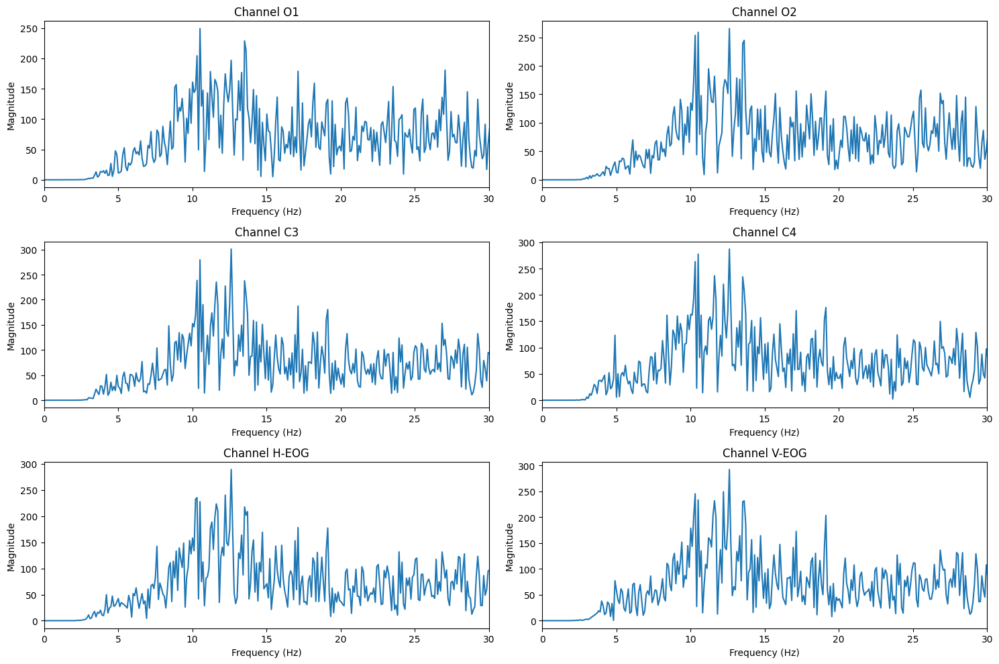

In [139]:
N_samples = len(clean_eeg_single_asr[0])
freq_resolution = fs / N_samples

fft_data = scipy.fftpack.fft(clean_eeg_single_asr, axis=1)
frequencies = np.linspace(0, fs, N_samples, endpoint=False)

# Magnitude of FFT
fft_magnitude = np.abs(fft_data)

# Setup plot with 3 rows and 2 columns
fig, axs = plt.subplots(3, 2, figsize=(15, 10))

# Plot each channel's FFT magnitude
for i in range(6):
    row = i // 2
    col = i % 2
    axs[row, col].plot(frequencies[:N_samples // 2], fft_magnitude[i, :N_samples // 2])  # Only plot the first half of frequencies
    axs[row, col].set_xlim([0, 30])  # Limiting x-axis to 50 Hz
    axs[row, col].set_title(f'Channel {channel_names_or[i]}')
    axs[row, col].set_xlabel('Frequency (Hz)')
    axs[row, col].set_ylabel('Magnitude')

# Add spacing between plots
plt.tight_layout()

# Show the plot
plt.show()

### Apply it on the rotation data - VOR 2Hz

In [140]:
from scipy.stats import pearsonr
import pywt

window_size_sec = 10
decomposition_level = 5
expo = 2**decomposition_level
wavelet = 'db4'
swt_len = int(window_size_sec * fs / expo)*expo
asr_num_chans = 6

local_window = 146
local_motion_idx = local_window*10*fs
local_post_motion_idx = local_motion_idx + swt_len

local_motion_indices = true_motion_detected[62]

eeg_stim = filtered_data[:asr_num_chans, local_motion_idx:local_post_motion_idx]
imu_stim = imu_features[:, local_motion_idx:local_post_motion_idx]
imu_lags = imu_features.copy()

adjusted_imu_features = np.zeros((eeg_stim.shape[0], imu_stim.shape[0], imu_stim.shape[1]))

for eeg_index in range(eeg_stim.shape[0]):
    for imu_index in range(imu_stim.shape[0]):
        correlation = correlate(eeg_stim[eeg_index], imu_stim[imu_index], mode='full')
        lags = np.arange(-len(correlation) // 2, len(correlation) // 2 + 1)
        max_corr_index = np.argmax(np.abs(correlation))
        lag = lags[max_corr_index]
        # Limit the lag to only 1 s
        if abs(lag) > 1*fs:
            lag=0
            
        adjusted_imu_features[eeg_index, imu_index] = adjust_imu_feature(imu_stim[imu_index], lag)

0 0.0714591224731425
1 0.0734744296309527
2 0.0795902767072382
3 0.20008257550023434
4 0.12287868048644585
5 0.07209127790108413


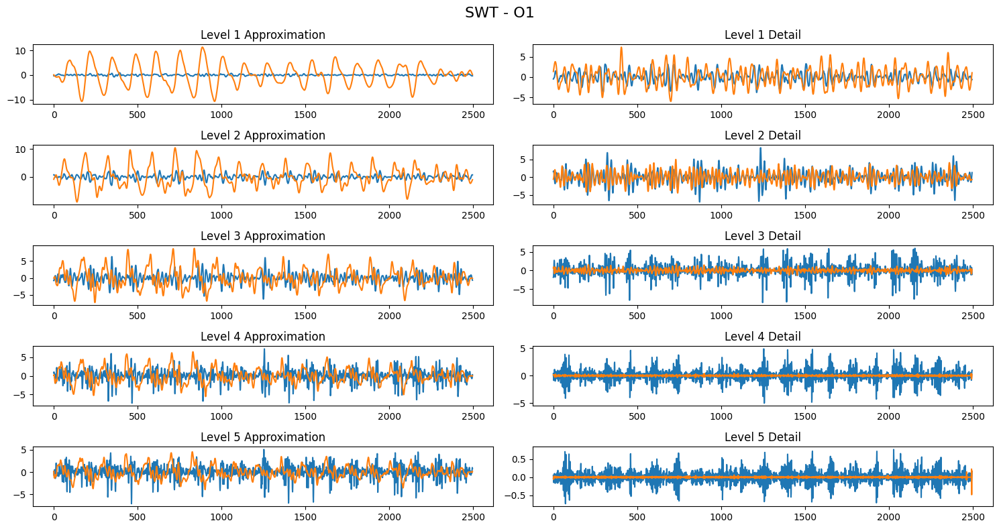

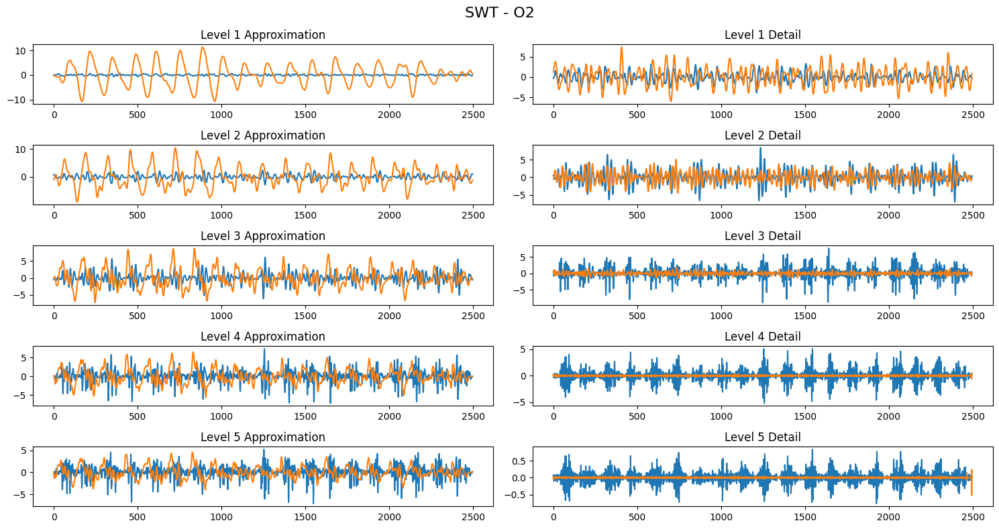

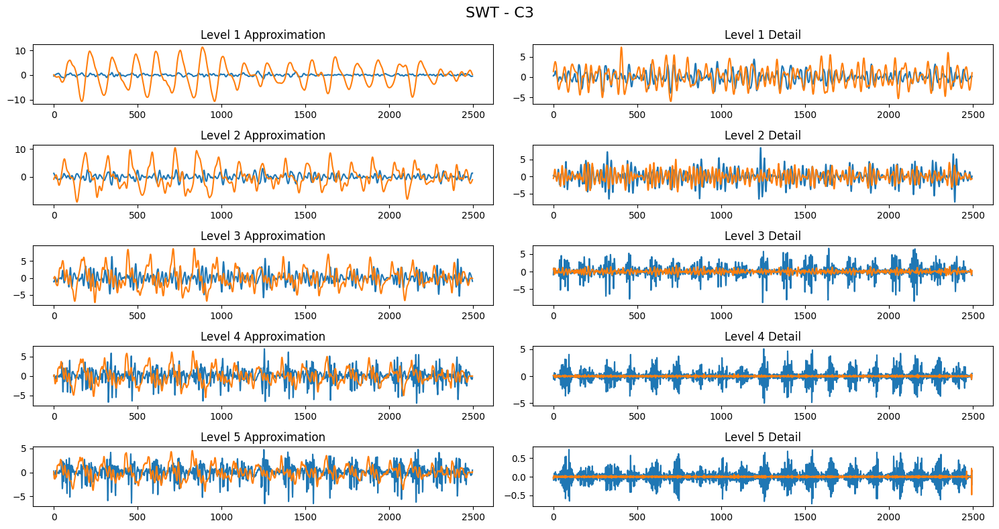

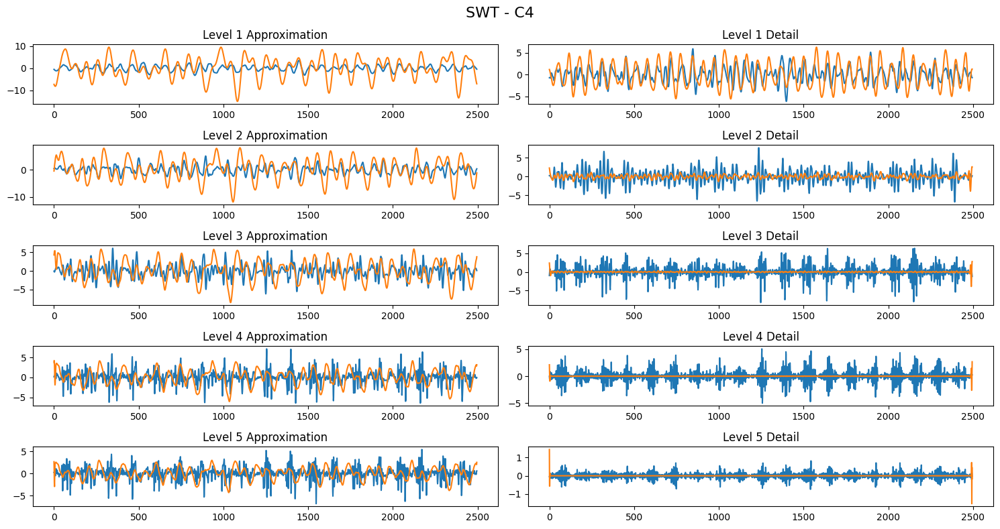

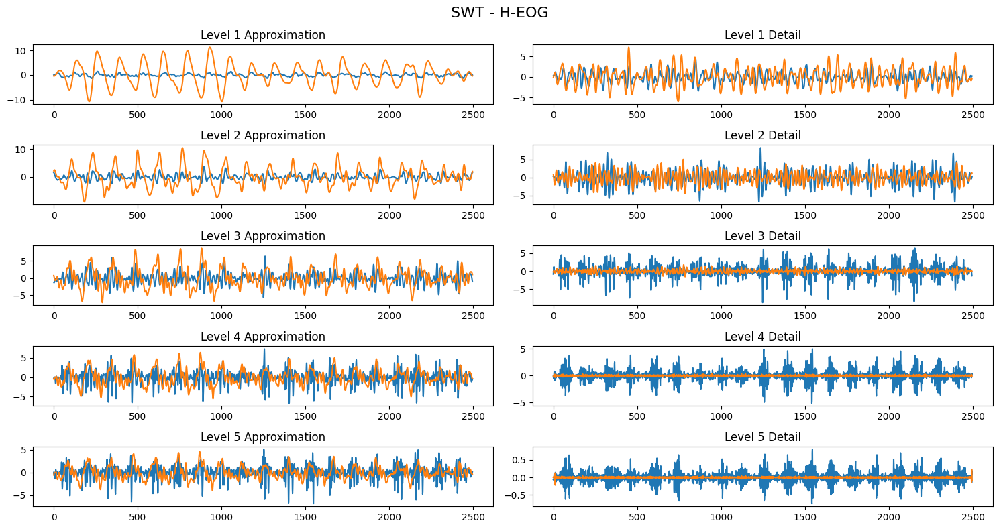

...

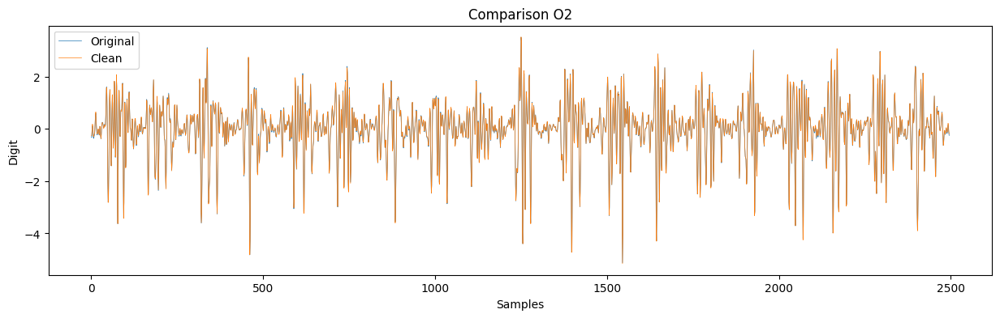

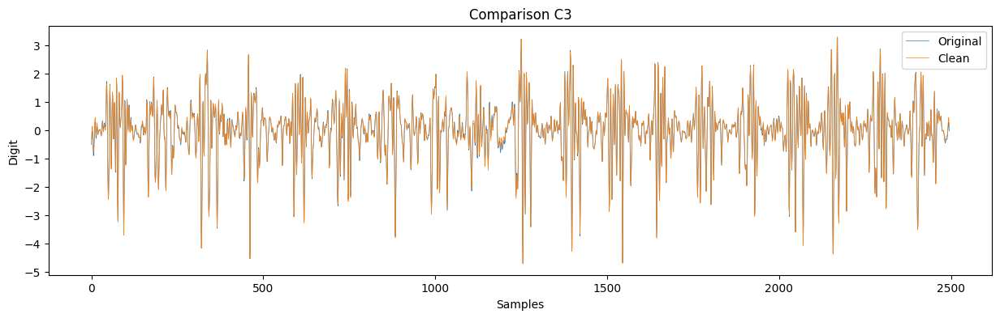

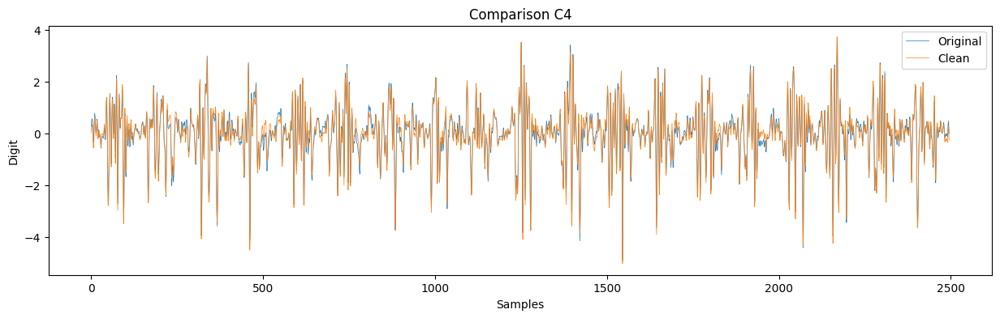

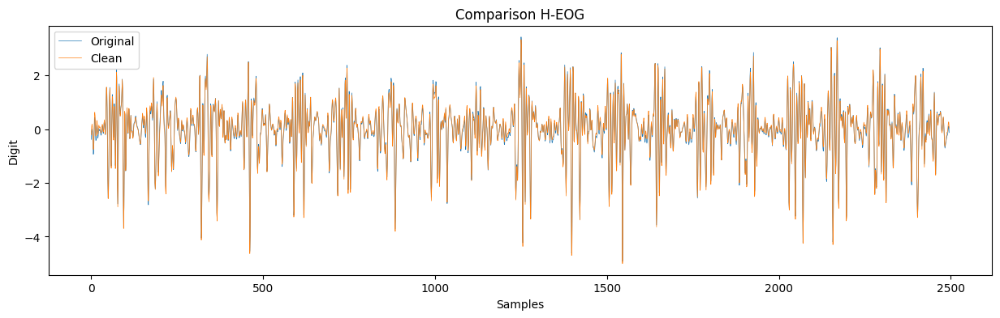

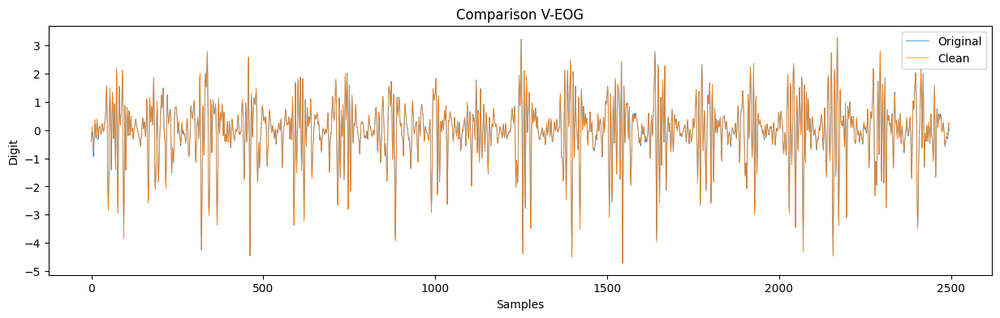

In [141]:
clean_eeg_single_asr = []
strides = swt_len

asr_data = filtered_data.copy()

for eeg_index in range(eeg_stim.shape[0]):
    if not signal_bad_indices[local_window][eeg_index+1]:
        clean_eeg_single_asr.append(eeg_stim[eeg_index])
    else:
        max_correlation = -np.inf
        best_imu_index = None
        for imu_index in range(adjusted_imu_features.shape[1]):
            corr, _ = pearsonr(eeg_stim[eeg_index], adjusted_imu_features[eeg_index, imu_index])
            if corr > max_correlation:
                max_correlation = corr
                best_imu_index = imu_index
        print(eeg_index, max_correlation)

        ##############################################################################################################
        # Apply Adaptive filtering to generate noise for the signal 
        ##############################################################################################################
        # asr_data[eeg_index], _ = filter_sos(asr_data[eeg_index], 'bandpass', [4, 50.0], fs, 4)

        # Perform Wavelet Transform on both reference and EEG data to decompose them
        eeg_swt = asr_data[eeg_index:eeg_index+1, local_motion_idx:local_post_motion_idx].copy()
        ref_swt = adjusted_imu_features[eeg_index, best_imu_index:best_imu_index+1]
        # ref_swt = filtered_data[eeg_index:eeg_index+1, 3140*fs:3140*fs+4992]
        
        ref_dat_z, swt_ref_zparams = z_score_normalize(ref_swt)
        eeg_dat_z, eeg_data_zparams = z_score_normalize(eeg_swt)

        ##############################################################################################################
        # Start the SWT here 
        ##############################################################################################################
        coeffs_ref_swt = pywt.swt(ref_dat_z[0], wavelet, level=decomposition_level)
        coeffs_eeg_swt = pywt.swt(eeg_dat_z[0], wavelet, level=decomposition_level)
        
        ##############################################################################################################
        # Run the ASR clean on the SWT decompositions
        ##############################################################################################################
        coeffs_ref = np.array(coeffs_ref_swt)
        coeffs_eeg = np.array(coeffs_eeg_swt)
        
        # Extract approximation coefficients and detail coefficients of the ref signal
        ref_approx_coeffs = coeffs_ref[:, 0, :]
        ref_detail_coeffs = coeffs_ref[:, 1, :]

        # Extract approximation coefficients and detail coefficients of the eeg signal
        eeg_approx_coeffs = coeffs_eeg[:, 0, :]
        eeg_detail_coeffs = coeffs_eeg[:, 1, :]

        eeg_detail_asr = eeg_detail_coeffs.copy()
        ref_detail_asr = ref_detail_coeffs.copy()

        eeg_approx_asr = eeg_approx_coeffs.copy()
        ref_approx_asr = ref_approx_coeffs.copy()
        
        #####################################################################################
        eeg_start_components = 0
        eeg_end_components = 5
        
        #####################################################################################
        #####################################################################################
        
            
        #####################################################################################
        #####################################################################################
        asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.66, cutoff=15)   
        _, sample_mask = asr.fit(ref_detail_coeffs[eeg_start_components:eeg_end_components])        
        
        # for idx in range(0, eeg_detail_coeffs.shape[1], strides):  
        #     if idx+strides > eeg_detail_coeffs.shape[1]:
        #         break  
        #     bad_data = eeg_detail_asr[eeg_start_components:eeg_end_components, idx:idx+strides]    
        #     clean_data, ma = asr.transform(bad_data)
        #     eeg_detail_asr[eeg_start_components:eeg_end_components, idx:idx+strides] = ma
        eeg_detail_asrs = eeg_detail_asr[eeg_start_components:eeg_end_components]

        #####################################################################################
        #####################################################################################
        asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.66, cutoff=15)   
        _, sample_mask = asr.fit(ref_approx_coeffs[eeg_start_components:eeg_end_components])        
        
        for idx in range(0, eeg_approx_coeffs.shape[1], strides):  
            if idx+strides > eeg_approx_coeffs.shape[1]:
                break        
            bad_data = eeg_approx_asr[eeg_start_components:eeg_end_components, idx:idx+strides]       
            clean_data, ma = asr.transform(bad_data)
            eeg_approx_asr[eeg_start_components:eeg_end_components, idx:idx+strides] = ma
        eeg_approx_asrs = eeg_approx_asr[eeg_start_components:eeg_end_components]
        
        #####################################################################################
        fig, axs = plt.subplots(decomposition_level, 2, figsize=(15, 8))
        fig.suptitle(f'SWT - {channel_names_or[eeg_index]}', fontsize=16)

        for level in range(decomposition_level):
            axs[level, 0].plot(coeffs_eeg_swt[level][0][:])
            axs[level, 0].plot(coeffs_ref_swt[level][0][:])
            axs[level, 0].set_title(f'Level {level + 1} Approximation')

            # Detail coefficients
            axs[level, 1].plot(coeffs_eeg_swt[level][1][:])
            axs[level, 1].plot(coeffs_ref_swt[level][1][:])
            axs[level, 1].set_title(f'Level {level + 1} Detail')

        plt.tight_layout()
            
        coeffs_for_reconstruction = [(eeg_approx_asrs[i], eeg_detail_asrs[i]) for i in range(eeg_approx_asrs.shape[0])]    
        # coeffs_for_reconstruction = [(eeg_detail_asrs[i]) for i in range(eeg_approx_asrs.shape[0])]    

        clean_eeg_single_asr.append(pywt.iswt(coeffs_for_reconstruction, wavelet))
        
# Plot the clean data
for i in range(asr_num_chans):
    plot_normalized([eeg_stim[i], clean_eeg_single_asr[i]], ['Original', 'Clean'], ['Samples', 'Digit'], f'Comparison {channel_names_or[i]}')

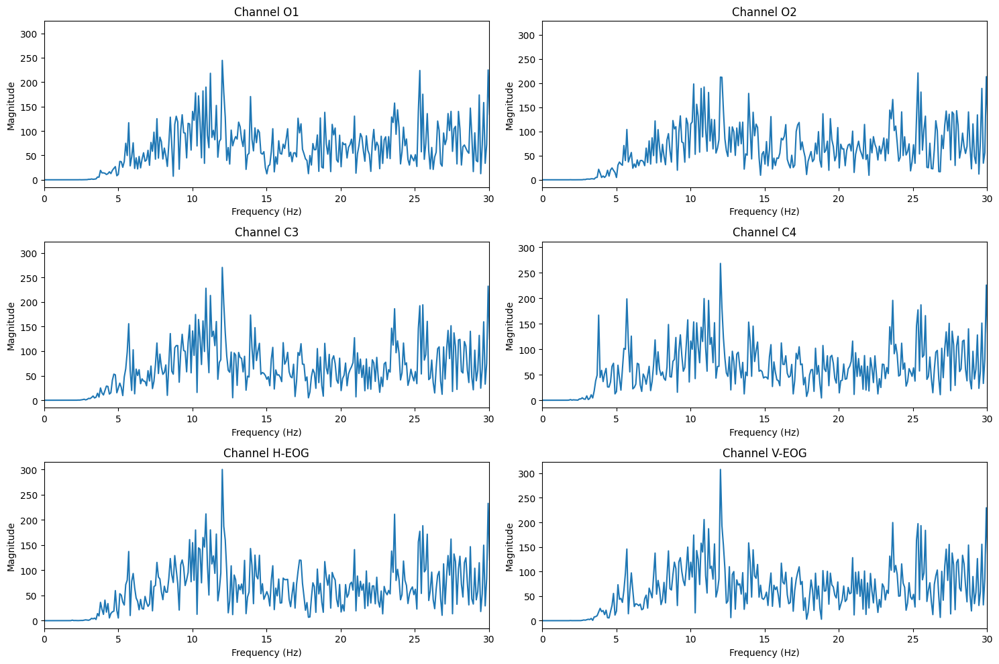

In [142]:
N_samples = len(clean_eeg_single_asr[0])
freq_resolution = fs / N_samples

fft_data = scipy.fftpack.fft(clean_eeg_single_asr, axis=1)
frequencies = np.linspace(0, fs, N_samples, endpoint=False)

# Magnitude of FFT
fft_magnitude = np.abs(fft_data)

# Setup plot with 3 rows and 2 columns
fig, axs = plt.subplots(3, 2, figsize=(15, 10))

# Plot each channel's FFT magnitude
for i in range(6):
    row = i // 2
    col = i % 2
    axs[row, col].plot(frequencies[:N_samples // 2], fft_magnitude[i, :N_samples // 2])  # Only plot the first half of frequencies
    axs[row, col].set_xlim([0, 30])  # Limiting x-axis to 50 Hz
    axs[row, col].set_title(f'Channel {channel_names_or[i]}')
    axs[row, col].set_xlabel('Frequency (Hz)')
    axs[row, col].set_ylabel('Magnitude')

# Add spacing between plots
plt.tight_layout()

# Show the plot
plt.show()

### Apply it on the rotation data - VOR 3Hz

## Apply SWT+ASR based on IMU features, to the entire data

In [143]:
# from scipy.stats import pearsonr
# import pywt

# window_size_sec = 10
# window_size_samples = 10*fs
# decomposition_level = 5
# expo = 2**decomposition_level
# wavelet = 'db4'
# swt_len = int(window_size_sec * fs / expo)*expo
# num_chans = 4

# for window_start in range(0, n_samples, window_size_samples):
#     window_end = window_start + window_size_samples   
#     if window_end > n_samples:
#         break
    
#     # Apply the SWT with decomposition of 5, window length of decomposition is 2496
#     motion_idx = int(window_start/window_size_samples)
#     if true_motion_detected[motion_idx]:
#         eeg_stim = filtered_data[:num_chans, window_start:window_start+swt_len]
#         imu_stim = imu_features[:, window_start:window_start+swt_len]
#         imu_lags = imu_features.copy()
        
#         # First, correct the phase shift for all IMU features for each EEG channel
#         adjusted_imu_features = np.zeros_like(imu_stim)  # Placeholder for adjusted IMU features
#         for eeg_index in range(eeg_stim.shape[0]):
#             for imu_index in range(imu_stim.shape[0]):
#                 correlation = correlate(eeg_stim[eeg_index], imu_stim[imu_index], mode='full')
#                 lags = np.arange(-len(correlation) // 2, len(correlation) // 2 + 1)
#                 max_corr_index = np.argmax(np.abs(correlation))
#                 lag = lags[max_corr_index]
#                 adjusted_imu_features[imu_index] = adjust_imu_feature(imu_stim[imu_index], lag)

#         # After adjusting for lags, calculate Pearson correlation between all adjusted IMU features and all EEG channels
#         best_imu_for_eeg = []  # To store the index of the best-correlated IMU feature for each EEG channel
#         corr_list = []
#         for eeg_index in range(eeg_stim.shape[0]):
#             max_correlation = -np.inf
#             best_imu_index = None
#             for imu_index in range(adjusted_imu_features.shape[0]):
#                 corr, _ = pearsonr(eeg_stim[eeg_index], adjusted_imu_features[imu_index])
#                 if corr > max_correlation:
#                     max_correlation = corr
#                     best_imu_index = imu_index
#             best_imu_for_eeg.append(best_imu_index)
#             corr_list.append(max_correlation)
            
# # print(best_imu_for_eeg)
# # print(corr_list)

#             ##############################################################################################################
#             # Start the SWT here 
#             ##############################################################################################################

#             # asr_single = filtered_data[eeg_index].copy()
#             # asr_single = filter_iir(asr_single, 'bandpass', [5, 40.0], fs, 4)
#             # eeg_swt = asr_single[window_start:window_start+swt_len]

#             # Perform Wavelet Transform on both reference and EEG data to decompose them
#             ref_swt = adjusted_imu_features[:1]
#             eeg_swt = eeg_stim[eeg_index:eeg_index+1]

#             ref_dat_z, swt_ref_zparams = z_score_normalize(ref_swt)
#             eeg_dat_z, eeg_data_zparams = z_score_normalize(eeg_swt)

#             coeffs_ref_swt = pywt.swt(ref_dat_z[0], wavelet, level=decomposition_level)
#             coeffs_eeg_swt = pywt.swt(eeg_dat_z[0], wavelet, level=decomposition_level)
            
#             if(motion_idx == 59):
#                 fig, axs = plt.subplots(decomposition_level, 2, figsize=(15, 10))
#                 fig.suptitle('SWT - Fp2', fontsize=16)

#                 for level in range(decomposition_level):
#                     axs[level, 0].plot(coeffs_eeg_swt[level][0][:], label='EEG Approximation')
#                     axs[level, 0].plot(coeffs_ref_swt[level][0][:], label='Ref Approximation')
#                     axs[level, 0].set_title(f'Level {level + 1} Approximation')
#                     axs[level, 0].legend()

#                     axs[level, 1].plot(coeffs_eeg_swt[level][1][:], label='EEG Detail')
#                     axs[level, 1].plot(coeffs_ref_swt[level][1][:], label='Ref Detail')
#                     axs[level, 1].set_title(f'Level {level + 1} Detail')
#                     axs[level, 1].legend()

#                 plt.tight_layout()
#                 plt.show()
            
            
#             ##############################################################################################################
#             # Run the ASR clean on the SWT decompositions
#             ##############################################################################################################
#             coeffs_ref = np.array(coeffs_ref_swt)
#             coeffs_eeg = np.array(coeffs_eeg_swt)
            
#             # Extract approximation coefficients and detail coefficients of the ref signal
#             ref_approx_coeffs = coeffs_ref[:, 0, :]
#             ref_detail_coeffs = coeffs_ref[:, 1, :]

#             # Extract approximation coefficients and detail coefficients of the eeg signal
#             eeg_approx_coeffs = coeffs_eeg[:, 0, :]
#             eeg_detail_coeffs = coeffs_eeg[:, 1, :]

#             eeg_detail_asr = eeg_detail_coeffs.copy()
#             ref_detail_asr = ref_detail_coeffs.copy()

#             eeg_approx_asr = eeg_approx_coeffs.copy()
#             ref_approx_asr = ref_approx_coeffs.copy()

#             # We need to tune the ASR carefully in this case
#             print(int(window_start/window_size_samples))
#             asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.5, cutoff=20)   
#             _, sample_mask = asr.fit(ref_detail_coeffs)        

#             # Iterate through the entire data to remove motion artifacts if any
#             for idx in range(0, eeg_detail_coeffs.shape[1], swt_len):        
#                 bad_data = eeg_detail_coeffs[:, idx:idx+swt_len]    
#                 clean_data, ma = asr.transform(bad_data)
#                 eeg_detail_asr[:, idx:idx+swt_len] = ma
                
#             eeg_detail_asrs = eeg_detail_asr

#             # We need to tune the ASR carefully in this case
#             asr = ASR(sfreq=fs, method='rieman', estimator='lwf', win_overlap=0.5, cutoff=30)   
#             _, sample_mask = asr.fit(ref_approx_coeffs)        

#             # Iterate through the entire data to remove motion artifacts if any
#             for idx in range(0, eeg_approx_coeffs.shape[1], swt_len):        
#                 bad_data = eeg_approx_coeffs[:, idx:idx+swt_len]       
#                 clean_data, ma = asr.transform(bad_data)
#                 eeg_approx_asr[:, idx:idx+swt_len] = ma
                
#             eeg_approx_asrs = eeg_approx_asr


## Plot the band power to first check the data

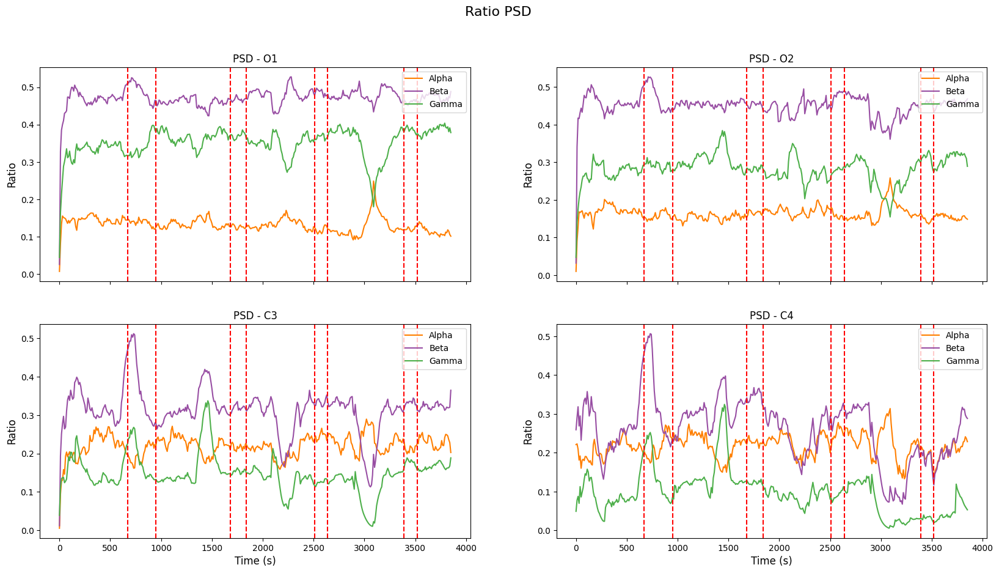

In [144]:
from brainflow.data_filter import DataFilter, FilterTypes, DetrendOperations, WindowOperations

nums_chans = 4

# nums_chans = 2
# Analyze the bio signals here
WINDOW_SIZE = 10*fs # 2-second windows
OVERLAP = int(WINDOW_SIZE*0)  # 50% overlap
channel_names = ['O1', 'O2', 'C3', 'C4']

fig, axs = plt.subplots(2, 2, figsize=(20, 10), sharex=True)
fig.suptitle('Ratio PSD', fontsize=16)  # Add this line for the title

absolute_data_alpha = {name: [] for name in channel_names}
absolute_data_beta = {name: [] for name in channel_names}
absolute_data_gamma = {name: [] for name in channel_names}

relative_data_alpha = {name: [] for name in channel_names}
relative_data_beta = {name: [] for name in channel_names}
relative_data_gamma = {name: [] for name in channel_names}

# #############################################################################
# ######################### Time-Resolved PSD plot ############################
# #############################################################################        
cmap = plt.cm.Set1
psd_data = filtered_data[:, :]
data_len = filtered_data[:, :].shape[1]
nfft = DataFilter.get_nearest_power_of_two(fs)

intervals = [(1260*fs, 1350*fs), (1600*fs, 1750*fs), (1480*fs, 1550*fs)]


# Only account for the first 2 channels
for i in range(nums_chans):
    spectrogram = {'delta':[], 'theta':[], 'alpha':[], 'beta':[], 'gamma':[]}
    relative_spectrogram = {'delta':[], 'theta':[], 'alpha':[], 'beta':[], 'gamma':[]}

    process_data = psd_data[i, :]
    for start in range(0, data_len, WINDOW_SIZE - OVERLAP):
        if i == 0:
            coef = 1
        else:
            coef = 1
        window = process_data[start:start + WINDOW_SIZE]*coef
        
        if len(window) < nfft:
            break
                        
        psd = DataFilter.get_psd_welch(window, nfft, nfft // 2, fs, WindowOperations.BLACKMAN_HARRIS.value)
        
        band_power_delta = DataFilter.get_band_power(psd, 2.0, 4.0)
        band_power_theta = DataFilter.get_band_power(psd, 4.0, 7.0)
        band_power_alpha = DataFilter.get_band_power(psd, 8.0, 12.0)
        band_power_beta = DataFilter.get_band_power(psd, 12.0, 30.0)
        band_power_gamma = DataFilter.get_band_power(psd, 30.0, 50.0)
        
        # Calculate total power for relative band power calculation
        total_power = band_power_alpha + band_power_beta + band_power_gamma + band_power_theta
        
        spectrogram['delta'].append(band_power_delta)
        spectrogram['theta'].append(band_power_theta)
        spectrogram['alpha'].append(band_power_alpha)
        spectrogram['beta'].append(band_power_beta)
        spectrogram['gamma'].append(band_power_gamma)
        
        # Calculate relative band powers
        relative_spectrogram['delta'].append(band_power_delta / total_power)
        relative_spectrogram['theta'].append(band_power_theta / total_power)
        relative_spectrogram['alpha'].append(band_power_alpha / total_power)
        relative_spectrogram['beta'].append(band_power_beta / total_power)
        relative_spectrogram['gamma'].append(band_power_gamma / total_power)
        
            
    time_x = np.arange(len(spectrogram['alpha']))*10

    # axs[i//2 ,i % 2].plot(time_x, spectrogram['alpha'], label='Alpha', color=cmap(4))    
    # axs[i//2 ,i % 2].plot(time_x, spectrogram['beta'], label='Beta', color=cmap(3))    
    
    # axs[i//2 ,i % 2].plot(time_x, spectrogram['gamma'], label='Gamma', color=cmap(2))
    spec_series = pd.Series(relative_spectrogram['alpha'])
    smoothed_sepc = spec_series.ewm(span=10).mean()
    smoothed_spec_alpha = smoothed_sepc.values

    spec_series = pd.Series(relative_spectrogram['beta'])
    smoothed_sepc = spec_series.ewm(span=10).mean()
    smoothed_spec_beta = smoothed_sepc.values
    
    spec_series = pd.Series(relative_spectrogram['gamma'])
    smoothed_sepc = spec_series.ewm(span=10).mean()
    smoothed_spec_gamma = smoothed_sepc.values
    
    spec_series = pd.Series(relative_spectrogram['theta'])
    smoothed_sepc = spec_series.ewm(span=10).mean()
    smoothed_spec_theta = smoothed_sepc.values

    # axs[i//2 , i % 2].plot(time_x, relative_spectrogram['alpha'], label='Alpha', color=cmap(4))    
    # axs[i//2 , i % 2].plot(time_x, relative_spectrogram['beta'], label='Beta', color=cmap(3))    
    # axs[i//2 , i % 2].plot(time_x, relative_spectrogram['gamma'], label='Gamma', color=cmap(2))
    # axs[i//2 , i % 2].plot(time_x, relative_spectrogram['theta'], label='Theta', color=cmap(1))

    axs[i//2 , i % 2].plot(time_x, smoothed_spec_alpha, label='Alpha', color=cmap(4))    
    axs[i//2 , i % 2].plot(time_x, smoothed_spec_beta, label='Beta', color=cmap(3))    
    axs[i//2 , i % 2].plot(time_x, smoothed_spec_gamma, label='Gamma', color=cmap(2))
    # axs[i//2 , i % 2].plot(time_x, smoothed_spec_theta, label='Theta', color=cmap(1))

    # print(relative_spectrogram['alpha'])

    axs[i//2 , i % 2].legend(fontsize=10, loc='upper right')
    axs[i//2 , i % 2].set_ylabel('Ratio',fontsize=12)
    axs[i//2 , i % 2].set_title(f'PSD - {channel_names[i]}',fontsize=12)

    absolute_data_alpha[channel_names[i]].extend(spectrogram['alpha']) 
    absolute_data_beta[channel_names[i]].extend(spectrogram['beta']) 
    absolute_data_gamma[channel_names[i]].extend(spectrogram['gamma']) 

    relative_data_alpha[channel_names[i]].extend(relative_spectrogram['alpha']) 
    relative_data_beta[channel_names[i]].extend(relative_spectrogram['beta']) 
    relative_data_gamma[channel_names[i]].extend(relative_spectrogram['gamma']) 
    
    for j in range(len(stim_mark_start)):
        # Convert mark indices to time units based on your time_x calculation
        # Assuming 'mark' is in samples and needs to be converted to seconds
        # mark_time_seconds = stim_mark_start[j]*10
        axs[i//2 , i % 2].axvline(x=stim_mark_start[j]*10, color='red', linestyle='--')
        axs[i//2 , i % 2].axvline(x=stim_mark_end[j]*10, color='red', linestyle='--')

axs[1, 0].set_xlabel('Time (s)',fontsize=12)
axs[1, 1].set_xlabel('Time (s)',fontsize=12)


plt.show()    

In [145]:
# stim1_idx = 670*fs
# post_stim1_idx = 950*fs

# stim2_idx = 1680*fs
# post_stim2_idx = 1840*fs

# stim3_idx = 2510*fs
# post_stim3_idx = 2642*fs

# stim4_idx = 3394*fs
# post_stim4_idx = 3520*fs

# stim_mark_start = [67, 168, 251, 339]
# stim_mark_end = [95, 184, 264, 352]


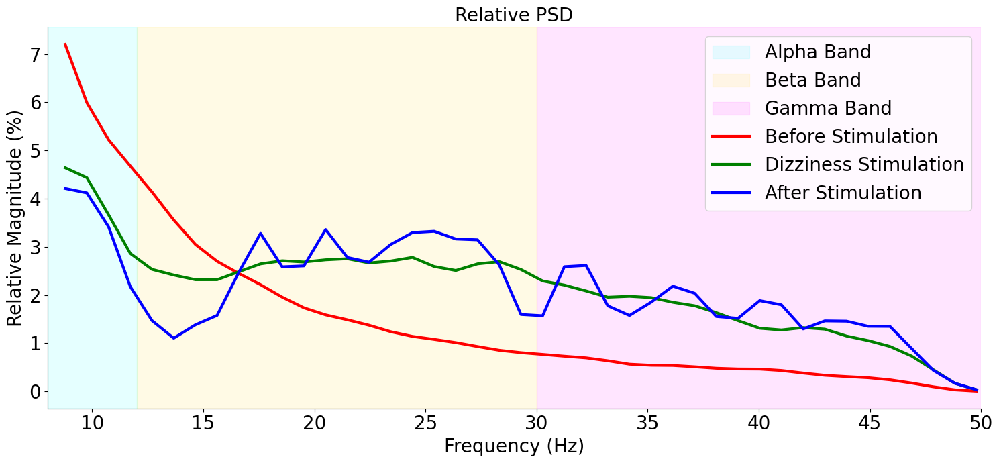

In [146]:
import numpy as np
import matplotlib.pyplot as plt
from brainflow.data_filter import DataFilter, WindowOperations

nums_chans = 4
channel_names = ['O1', 'O2', 'C3', 'C4']
intervals = [(520*250, 670*250), (950*250, 1100*250), (1075*250, 1085*250)]
intervals_name = ['Before Stimulation', 'Dizziness Stimulation', 'After Stimulation']
fs = 250  # Define the sampling frequency
nfft = DataFilter.get_nearest_power_of_two(fs)

# Prepare plot
fig, ax = plt.subplots(figsize=(15, 7))
colors = {'Alpha': 'aqua', 'Beta': 'gold', 'Gamma': 'magenta'}  # Colors for each band

colors = ['r', 'g', 'b']

ax.axvspan(8, 12, color='aqua', alpha=0.1, label='Alpha Band')
ax.axvspan(12, 30, color='gold', alpha=0.1, label='Beta Band')
ax.axvspan(30, 50, color='magenta', alpha=0.1, label='Gamma Band')

# Calculate PSD for each interval and plot
for i, interval in enumerate(intervals):
    start, end = interval
    window = filtered_data[:, start:end]  # Assuming filtered_data is the entire dataset
    
    # Iterate over each channel
    for j in range(nums_chans):
        if j == 1:  # Adjust based on the specific channel to be analyzed
            channel_data = window[j, :]
            
            if len(channel_data) < nfft:
                continue
            
            # Calculate the PSD
            psd, freq = DataFilter.get_psd_welch(channel_data, nfft, nfft // 2, fs, WindowOperations.BLACKMAN_HARRIS.value)
                
            # Define frequency band indices
            theta_indices = np.logical_and(freq >= 4, freq <= 7)
            alpha_indices = np.logical_and(freq >= 8, freq <= 12)
            beta_indices = np.logical_and(freq >= 12, freq <= 30)
            gamma_indices = np.logical_and(freq >= 30, freq <= 50)

            total_indices = np.logical_and(freq >= 8, freq <= 50)

            # Calculate total power over these bands
            total_power = (np.sum(psd[theta_indices])+
                            np.sum(psd[alpha_indices]) +
                           np.sum(psd[beta_indices]) +
                           np.sum(psd[gamma_indices]))
            
            
            # Normalize band powers by the calculated total power
            relative_alpha_power = psd[alpha_indices] / total_power
            relative_beta_power = psd[beta_indices] / total_power
            relative_gamma_power = psd[gamma_indices] / total_power
            
            # Plotting each band with its corresponding color
            # axs[0].plot(freq[alpha_indices], relative_alpha_power * 100, label=f'{intervals_name[i]}', color=colors['Alpha'])
            # axs[1].plot(freq[beta_indices], relative_beta_power * 100, label=f'{intervals_name[i]}', color=colors['Beta'])
            # axs[2].plot(freq[gamma_indices], relative_gamma_power * 100, label=f'{intervals_name[i]}', color=colors['Gamma'])

            plt.plot(freq[total_indices], psd[total_indices]*100/total_power, label=f'{intervals_name[i]}', color=colors[i], linewidth=3)
            # axs[1].plot(freq[beta_indices], relative_beta_power * 100, label=f'{intervals_name[i]}', color=colors['Beta'])
            # axs[2].plot(freq[gamma_indices], relative_gamma_power * 100, label=f'{intervals_name[i]}', color=colors['Gamma'])
            # plt.fill_between(freq[alpha_indices], 0, psd[alpha_indices]*100/total_power, color='aqua', alpha=0.3, label='Alpha Band' if i == 0 else "")
            # plt.fill_between(freq[beta_indices], 0, psd[beta_indices]*100/total_power, color='gold', alpha=0.3, label='Beta Band' if i == 0 else "")
            # plt.fill_between(freq[gamma_indices], 0, psd[gamma_indices]*100/total_power, color='magenta', alpha=0.3, label='Gamma Band' if i == 0 else "")

# Adjusting plots
for ax in axs:
    plt.xlim(8, 50)  # Start from 8 Hz to 50 Hz
    plt.xlabel('Frequency (Hz)', fontsize=20)
    plt.ylabel('Relative Magnitude (%)', fontsize=20)
    plt.title('Relative PSD', fontsize=20)
    plt.legend(fontsize=20)
    # ax.grid(True)

    # Hide the right and top spines
    ax = plt.gca()  # Get current axes
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.tick_params(axis='both', labelsize=20)  # Adjust the size as needed

plt.savefig('figures/band_power.svg', format='svg', bbox_inches='tight')

plt.tight_layout()
plt.show()


## Decompose the trend of the band power

In [147]:
# # Convert your list to a pandas Series for convenience
# beta_series = pd.Series(relative_data_beta['C3'])

# # Apply Exponentially Weighted Moving Average (EWMA)
# # `span` controls the amount of smoothing (similar to the window size in moving average)
# # Smaller `span` value leads to less smoothing
# smoothed_beta = beta_series.ewm(span=50).mean()
# smoothed_beta = smoothed_beta.values

# plt.figure(figsize=(15, 3))    
# plt.plot(time_x, smoothed_beta, label='Beta trend')

# for j in range(len(stim_mark_start)):
#     plt.axvline(x=stim_mark_start[j]*10, color='red', linestyle='--')
#     plt.axvline(x=stim_mark_end[j]*10, color='red', linestyle='--')

# plt.xlabel('Time (s)')
# plt.legend()
# plt.show()


## Heart rate

In [148]:
import neurokit2 as nk
import time

ecg = (filtered_data[6]).copy()

segment_length = 10 * fs  # 2 seconds long segment
stride = 5 * fs  # 1 second stride
hr = []
hrv = []
    
previous_signals, previous_info = None, None

for start in range(0, n_samples, stride):
    end = start + segment_length
    if end > n_samples:
        break
    segment = ecg[start:end]

    try:
        signals, info = nk.ecg_process(segment, sampling_rate=fs, method='pantompkins1985')
        # Update previous_signals and previous_info on successful processing
        previous_signals, previous_info = signals, info
    except Exception as e:
        print(f"Error processing segment from {start} to {end}: {str(e)}")
        # Use the last successful signals and info if an error occurs
        if previous_signals is not None and previous_info is not None:
            signals, info = previous_signals, previous_info
        else:
            # If previous_signals is None, it means error occurred in the first segment
            continue  # Skip this loop iteration if no previous data to use

    # Calculate HR and HRV indices only if signals were successfully processed or retrieved
    if signals is not None:
        hr.append(np.mean(signals['ECG_Rate']))
        hrv_indices = nk.hrv_time(signals['ECG_R_Peaks'], sampling_rate=fs, show=False)
        hrv.append(hrv_indices['HRV_MeanNN'])

C:\Users\Nhan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Nhan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Nhan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(


Error processing segment from 555000 to 557500: cannot convert float NaN to integer


C:\Users\Nhan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Nhan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Nhan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\neurokit2\signal\signal_period.py:84: NeuroKitWarning: Too few peaks detected to compute the rate. Returning empty vector.
  warn(


Error processing segment from 775000 to 777500: cannot convert float NaN to integer


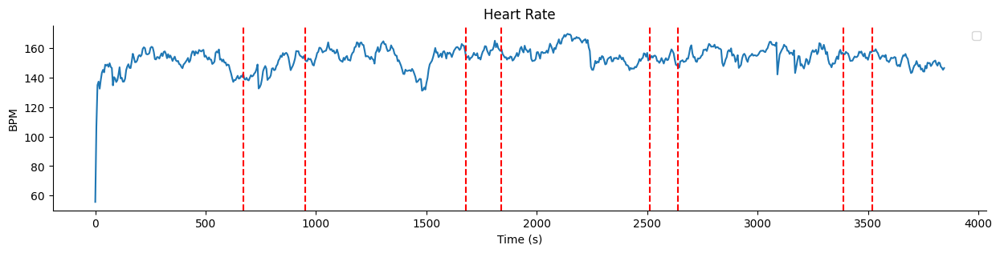

In [149]:
heart_rates_series = pd.Series(hr)

smoothed_hr = heart_rates_series.ewm(span=10).mean()
smoothed_hr = smoothed_hr.values    


plt.figure(figsize=(15, 3))    
plt.plot(np.arange(len(smoothed_hr))*5, smoothed_hr)
# plt.plot(np.arange(len(heart_rates))/2, heart_rates)
for j in range(len(stim_mark_start)):
    plt.axvline(x=stim_mark_start[j]*10, color='red', linestyle='--')
    plt.axvline(x=stim_mark_end[j]*10, color='red', linestyle='--')

ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')


plt.xlabel('Time (s)')
plt.ylabel('BPM')
plt.title('Heart Rate')
plt.legend()
plt.show()

In [150]:
n_samples

964800

In [151]:
len(hrv)

770

C:\Users\Nhan\AppData\Local\Temp\ipykernel_41952\2047836791.py:3: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  smoothed_hrv = heart_ratesv_series.ewm(span=10).mean()


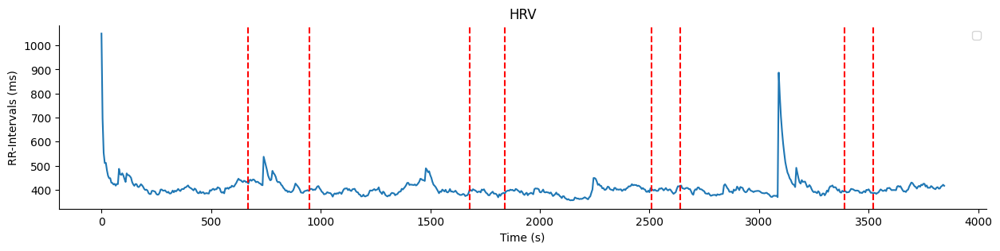

In [152]:

heart_ratesv_series = pd.Series(hrv)

smoothed_hrv = heart_ratesv_series.ewm(span=10).mean()
smoothed_hrv = smoothed_hrv.values    


plt.figure(figsize=(15, 3))    
plt.plot(np.arange(len(hrv))*5, smoothed_hrv)
# plt.plot(np.arange(len(heart_rates))/2, heart_rates)
for j in range(len(stim_mark_start)):
    plt.axvline(x=stim_mark_start[j]*10, color='red', linestyle='--')
    plt.axvline(x=stim_mark_end[j]*10, color='red', linestyle='--')

ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

plt.xlabel('Time (s)')
plt.ylabel('RR-Intervals (ms)')
plt.title('HRV')
plt.legend()
plt.show()

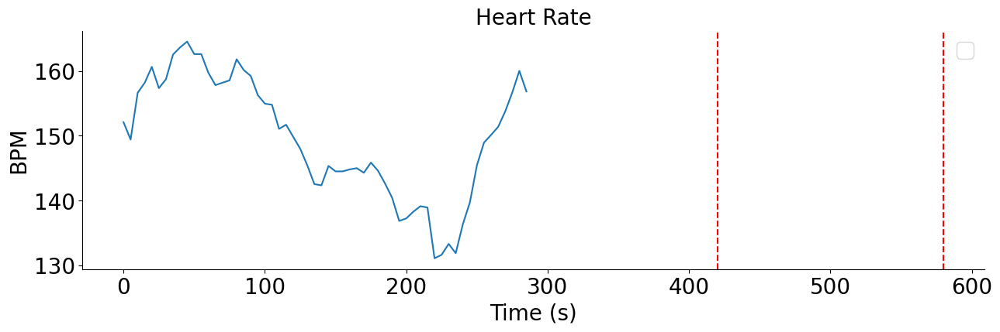

In [153]:
# Visualize for the paper
plt.figure(figsize=(15, 4))    
plt.plot(np.arange(len(smoothed_hr[252:310]))*5, smoothed_hr[252:310])

for j in range(1,2):
    plt.axvline(x=stim_mark_start[j]*10 -252*5, color='red', linestyle='--')
    plt.axvline(x=stim_mark_end[j]*10 - 252*5, color='red', linestyle='--')
    
# Hide the right and top spines
ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

plt.xlabel('Time (s)', fontsize=20)
plt.ylabel('BPM', fontsize=20)
plt.title('Heart Rate', fontsize=20)
plt.legend(fontsize=20)
ax.tick_params(axis='both', labelsize=20)  # Adjust the size as needed

# plt.savefig('figures/heart_rate.svg', format='svg', bbox_inches='tight')
plt.show()

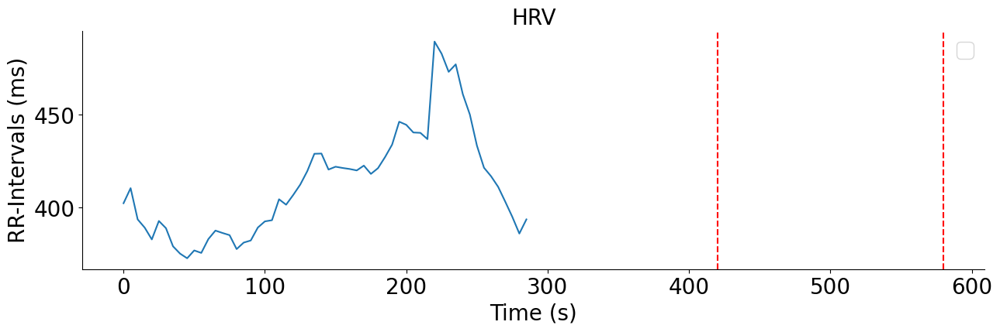

In [154]:
# Visualize for the paper
plt.figure(figsize=(15, 4))    
plt.plot(np.arange(len(smoothed_hrv[252:310]))*5, smoothed_hrv[252:310])

for j in range(1,2):
    plt.axvline(x=stim_mark_start[j]*10 -252*5, color='red', linestyle='--')
    plt.axvline(x=stim_mark_end[j]*10 - 252*5, color='red', linestyle='--')
    
# Hide the right and top spines
ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')

plt.xlabel('Time (s)', fontsize=20)
plt.ylabel('RR-Intervals (ms)', fontsize=20)
plt.title('HRV', fontsize=20)
plt.legend(fontsize=20)
ax.tick_params(axis='both', labelsize=20)  # Adjust the size as needed

# plt.savefig('figures/heart_rate_variability.svg', format='svg', bbox_inches='tight')
plt.show()

### EOG

In [155]:
from utils.utils import extract_blink_rate, extract_blink_rate_custom

all_blink_events = extract_blink_rate(eog_data.copy(), fs, window_size_samples, window_stride_size_samples)
# all_blink_events = extract_blink_rate_custom(eog_data.copy(), fs, window_size_samples, window_stride_size_samples_base, window_stride_size_samples_non_base, post_stim1_idx)


NameError: name 'eog_data' is not defined